# Exploratory Data Analysis - TourXtreme¶

## 🔹 Fase 1 – Comprensión del Negocio (Business Understanding)

### **Introducción**
LA empresa TourXtreme nos contrató para desarrollar una solución basada en análisis de datos climáticos. TourXtreme ofrece paquetes turísticos de aventura en Australia como clases de surf, senderismo, trekking, buceo, kayak, ciclismo y camping. Dado que estas actividades se realizan al aire libre, están altamente influenciadas por el clima.

El objetivo principal es anticipar las condiciones meteorológicas para recomendar al cliente las actividades más seguras y óptimas según el pronóstico. A través del análisis de datos históricos, se espera identificar patrones climáticos que permitan predecir condiciones favorables o desfavorables, mejorando así la experiencia del usuario, reduciendo riesgos operativos y optimizando la planificación logística.

Este informe se estructura en base a las dos primeras fases de la metodología CRISP-DM:

* Comprensión del negocio (Business Understanding)
* Comprensión de los datos (Data Understanding)

## 1. Business Understanding

### 🧭 Contexto del Cliente y Problema del Negocio

**TourXtreme** es una empresa dedicada al turismo aventura en Australia, ofreciendo experiencias como surf, trekking, kayak, buceo y camping. Actualmente, la planificación de actividades depende de información meteorológica general y decisiones manuales por parte de los operadores.

**Problema del negocio:**
La empresa enfrenta desafíos al programar actividades en condiciones climáticas no óptimas, lo que puede generar suspensiones, baja satisfacción del cliente, o incluso riesgos para la seguridad.

**Objetivo del análisis:**
Aprovechar datos meteorológicos históricos para identificar patrones que permitan:
- Recomendar actividades según condiciones climáticas óptimas.
- Predecir la ocurrencia de lluvia.
- Segmentar tipos de clima para optimizar la oferta turística.

**Impacto esperado:**
- Reducción en cancelaciones y reprogramaciones.
- Mejora en la experiencia del cliente.
- Uso eficiente de recursos según el clima.
- Apoyo a decisiones estratégicas para operación en distintas regiones o temporadas.

**Justificación metodológica:**
Se utilizarán técnicas de análisis exploratorio, reglas de asociación y clustering para entender el comportamiento climático, así como modelos predictivos supervisados para anticipar eventos relevantes como la lluvia.


### Objetivos Clave

- Reducir cancelaciones y riesgos por condiciones climáticas adversas.  
- Mejorar la experiencia del cliente mediante recomendaciones basadas en clima.  
- Optimizar la planificación logística de actividades.  

### KPIs Relevantes

| **KPI**                          | **Descripción**                              | **Fórmula**                                            | **Unidad** |
|----------------------------------|----------------------------------------------|--------------------------------------------------------|------------|
| Precisión predicción lluvia     | Efectividad para predecir días lluviosos     | (Aciertos lluvia / Total predicciones)                | %          |
| Actividades sin incidentes      | Medida de sugerencias seguras                | (Actividades sin incidentes / Total actividades)      | %          |
| Tasa aceptación sugerencias     | Clientes que siguen la recomendación         | (Aceptadas / Sugeridas)                               | %          |
| Cancelaciones evitadas          | Cancelaciones prevenidas por modelo          | (Cancelaciones evitadas / Totales)                    | %          |

### Condiciones ideales por actividad (fuentes confiables)

- **Surf:** [Surfline](https://www.surfline.com) — Viento *offshore* < 30 km/h, olas de 1 a 2 m, cielos despejados.  
- **Senderismo/Trekking:** [Parks Australia](https://parksaustralia.gov.au) — Evitar temperaturas >35 °C, lluvia o viento > 40 km/h.  
- **Buceo:** [Scuba Diving Earth](https://www.scubadivingearth.com) — Temperatura del agua 20–30 °C, visibilidad buena.  
- **Kayak:** [Paddle Australia](https://paddle.org.au) — Viento < 25 km/h, sin lluvias intensas.  
- **Ciclismo:** [Bicycle Network](https://bicyclenetwork.com.au) — Buen clima, visibilidad adecuada, poco viento.  
- **Camping:** [Parks Australia](https://parksaustralia.gov.au) — Viento < 20 km/h, temperatura entre 10–25 °C, baja probabilidad de lluvia.  


## 🔹 Fase 2 – Comprensión de los Datos (Data Understanding)

# 1. Carga de librerías

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder


# 2. Carga del dataset original

In [2]:
df = pd.read_csv('../data/01_raw/weatherAUS.csv')


# 3. Revisión inicial

### Vista general del dataset

In [3]:
df.head()


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


### Información del dataset

In [4]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

### Estadísticas descriptivas

In [5]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000,142193.000000
mean,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235,2.360682
std,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594,8.477969
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000


# 4.Conversión de Fecha y Orden

## 4.1 Convertir la columna 'Date' a formato datetime

In [6]:
df['Date'] = pd.to_datetime(df['Date'])

In [7]:
print("Después de la conversión a datetime:")
print(df.head())

Después de la conversión a datetime:
        Date Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
0 2008-12-01   Albury     13.4     22.9       0.6          NaN       NaN   
1 2008-12-02   Albury      7.4     25.1       0.0          NaN       NaN   
2 2008-12-03   Albury     12.9     25.7       0.0          NaN       NaN   
3 2008-12-04   Albury      9.2     28.0       0.0          NaN       NaN   
4 2008-12-05   Albury     17.5     32.3       1.0          NaN       NaN   

  WindGustDir  WindGustSpeed WindDir9am  ... Humidity3pm  Pressure9am  \
0           W           44.0          W  ...        22.0       1007.7   
1         WNW           44.0        NNW  ...        25.0       1010.6   
2         WSW           46.0          W  ...        30.0       1007.6   
3          NE           24.0         SE  ...        16.0       1017.6   
4           W           41.0        ENE  ...        33.0       1010.8   

   Pressure3pm  Cloud9am  Cloud3pm  Temp9am  Temp3pm  RainToday  RI

## 4.2 Ordenar por la columna Date

### Verificar que 'Date' ahora sea de tipo datetime

In [8]:
print(df.dtypes)  

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RISK_MM                 float64
RainTomorrow             object
dtype: object


### Ordenar el DataFrame por fecha

In [9]:
df = df.sort_values('Date')

### Mostrar el resultado después del ordenamiento

In [10]:
print("Después de ordenar por fecha:")
print(df.head())

Después de ordenar por fecha:
            Date  Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
44351 2007-11-01  Canberra      8.0     24.3       0.0          3.4       6.3   
44352 2007-11-02  Canberra     14.0     26.9       3.6          4.4       9.7   
44353 2007-11-03  Canberra     13.7     23.4       3.6          5.8       3.3   
44354 2007-11-04  Canberra     13.3     15.5      39.8          7.2       9.1   
44355 2007-11-05  Canberra      7.6     16.1       2.8          5.6      10.6   

      WindGustDir  WindGustSpeed WindDir9am  ... Humidity3pm  Pressure9am  \
44351          NW           30.0         SW  ...        29.0       1019.7   
44352         ENE           39.0          E  ...        36.0       1012.4   
44353          NW           85.0          N  ...        69.0       1009.5   
44354          NW           54.0        WNW  ...        56.0       1005.5   
44355         SSE           50.0        SSE  ...        49.0       1018.3   

       Pressure3pm  

## 4.3 Extraer el mes de cada fecha

### Crear nueva columna 'Month'

In [11]:
df['Month'] = df['Date'].dt.month

### Mostrar el resultado con la nueva columna

In [12]:
print("Después de agregar el mes:")
print(df[['Date', 'Month']].head())

Después de agregar el mes:
            Date  Month
44351 2007-11-01     11
44352 2007-11-02     11
44353 2007-11-03     11
44354 2007-11-04     11
44355 2007-11-05     11


## 4.4 Extraer el día de la semana

### Crear nueva columna 'DayOfWeek'

In [13]:
df['DayOfWeek'] = df['Date'].dt.dayofweek

### Mostrar el resultado con la nueva columna

In [14]:
print("Después de agregar el día de la semana:")
print(df[['Date', 'DayOfWeek']].head())

Después de agregar el día de la semana:
            Date  DayOfWeek
44351 2007-11-01          3
44352 2007-11-02          4
44353 2007-11-03          5
44354 2007-11-04          6
44355 2007-11-05          0


# 5. Revisión de duplicados (sin eliminarlos)

## Identificación de duplicados en el dataset

In [15]:
duplicados = df[df.duplicated()]
print(f'Duplicados exactos encontrados: {duplicados.shape[0]}')

Duplicados exactos encontrados: 0


## Marcado de registros duplicados 
#### (Se Crea una nueva columna para indicar duplicados)

In [16]:
df['is_duplicated'] = df.duplicated(keep=False).astype(int)
print(df[df['is_duplicated'] == 1].head())

Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RISK_MM, RainTomorrow, Month, DayOfWeek, is_duplicated]
Index: []

[0 rows x 27 columns]


# 6. Revisión de nulos por grupo de columnas

### 🌬️ 6.1 Nulos en direcciones del viento (variables categóricas)

In [17]:
print("🌬️ 6.1 Direcciones del viento (WindGustDir, WindDir9am, WindDir3pm):")
print(df[['WindGustDir', 'WindDir9am', 'WindDir3pm']].isnull().sum())

🌬️ 6.1 Direcciones del viento (WindGustDir, WindDir9am, WindDir3pm):
WindGustDir     9330
WindDir9am     10013
WindDir3pm      3778
dtype: int64


### 📈 6.2 Nulos en variables continuas para interpolación

In [18]:
print("\n📈 6.2 Variables continuas a interpolar (Temp3pm, MinTemp, Pressure3pm, Humidity3pm):")
print(df[['Temp3pm', 'MinTemp', 'Pressure3pm', 'Humidity3pm']].isnull().sum())


📈 6.2 Variables continuas a interpolar (Temp3pm, MinTemp, Pressure3pm, Humidity3pm):
Temp3pm         2726
MinTemp          637
Pressure3pm    13981
Humidity3pm     3610
dtype: int64


### 📊 6.3 Nulos en variables numéricas con valores extremos (imputación con mediana)

In [19]:
print("\n📊 6.3 Variables con valores extremos (Rainfall, WindSpeed9am, WindSpeed3pm):")
print(df[['Rainfall', 'WindSpeed9am', 'WindSpeed3pm']].isnull().sum())


📊 6.3 Variables con valores extremos (Rainfall, WindSpeed9am, WindSpeed3pm):
Rainfall        1406
WindSpeed9am    1348
WindSpeed3pm    2630
dtype: int64


### 🌧️ 6.4 Nulos en variables binarias (RainToday, RainTomorrow)

In [20]:
print("\n🌧️ 6.4 Variables binarias (RainToday, RainTomorrow):")
print(df[['RainToday', 'RainTomorrow']].isnull().sum())


🌧️ 6.4 Variables binarias (RainToday, RainTomorrow):
RainToday       1406
RainTomorrow       0
dtype: int64


# 7. Visualización general del dataset tras limpieza parcial


In [21]:
print("📊 Vista general del dataset tras imputaciones básicas:")
df.info()
df.describe()

📊 Vista general del dataset tras imputaciones básicas:
<class 'pandas.core.frame.DataFrame'>
Index: 142193 entries, 44351 to 35838
Data columns (total 27 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           142193 non-null  datetime64[ns]
 1   Location       142193 non-null  object        
 2   MinTemp        141556 non-null  float64       
 3   MaxTemp        141871 non-null  float64       
 4   Rainfall       140787 non-null  float64       
 5   Evaporation    81350 non-null   float64       
 6   Sunshine       74377 non-null   float64       
 7   WindGustDir    132863 non-null  object        
 8   WindGustSpeed  132923 non-null  float64       
 9   WindDir9am     132180 non-null  object        
 10  WindDir3pm     138415 non-null  object        
 11  WindSpeed9am   140845 non-null  float64       
 12  WindSpeed3pm   139563 non-null  float64       
 13  Humidity9am    140419 non-null  float64       
 14 

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM,Month,DayOfWeek,is_duplicated
count,142193,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,...,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000,142193.000000,142193.000000,142193.000000,142193.0
mean,2013-04-01 00:28:51.730816512,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,...,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235,2.360682,6.402544,2.992433,0.0
min,2007-11-01 00:00:00,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,...,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000,1.000000,0.000000,0.0
25%,2011-01-06 00:00:00,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,...,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000,3.000000,1.000000,0.0
50%,2013-05-27 00:00:00,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,...,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000,6.000000,3.000000,0.0
75%,2015-06-12 00:00:00,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,...,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000,9.000000,5.000000,0.0
max,2017-06-25 00:00:00,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,...,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000,12.000000,6.000000,0.0
std,NaN,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,...,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594,8.477969,3.426506,2.003625,0.0


# 8. Matriz de correlación

Tamaño del df: (142193, 27)


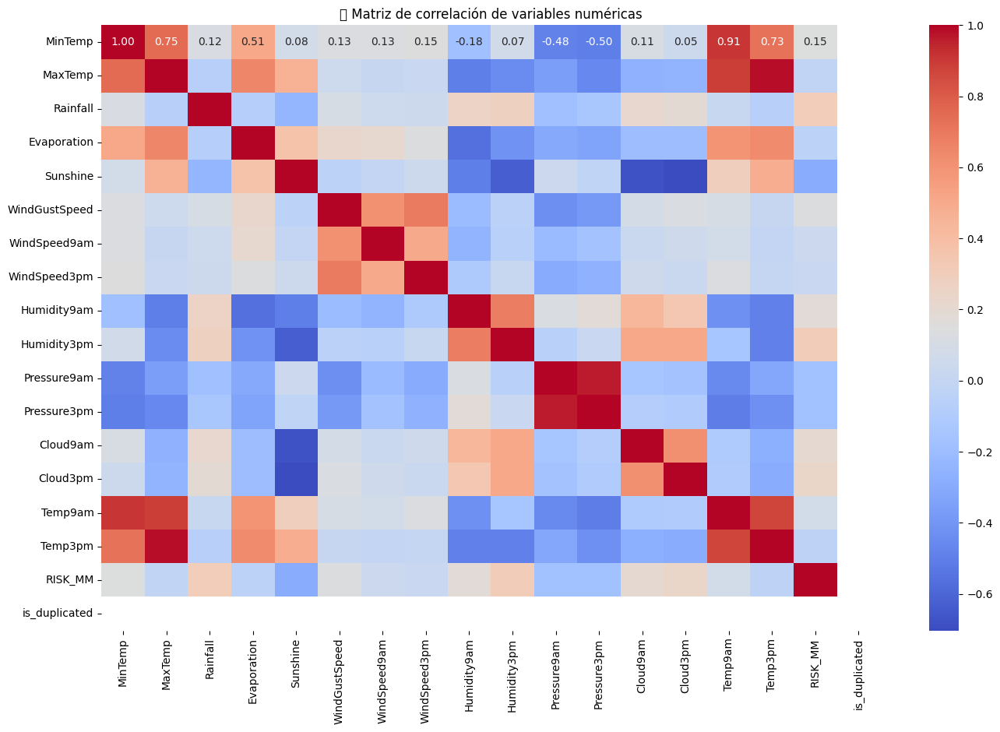

In [22]:
# 🧪 Activar visualización en Jupyter
%matplotlib inline

# 📚 Importar librerías
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings

warnings.filterwarnings("ignore")

# 🔍 Validación
print("Tamaño del df:", df.shape)

# 🔧 Selección y limpieza
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
df_clean = df[numeric_cols].replace([np.inf, -np.inf], np.nan).dropna()

# ✅ Crear matriz de correlación
correlation_matrix = df_clean.corr()

# 🧹 Eliminar figuras anteriores (importante si estás en JupyterLab)
plt.close('all')

# 🎨 Crear heatmap
if correlation_matrix.shape[0] > 1:
    fig, ax = plt.subplots(figsize=(14, 10))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', ax=ax)
    ax.set_title('🔗 Matriz de correlación de variables numéricas')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
else:
    print("⚠️ No hay suficientes columnas numéricas válidas.")


# 9. Relaciones entre variables climáticas

### 9.1 Dispersión de todas las variables numéricas contra Temp3pm

📏 Dimensiones: (119797, 8)
📌 Columnas: Index(['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'Humidity3pm',
       'Humidity9am', 'Pressure3pm', 'Temp3pm'],
      dtype='object')
🧼 Nulos por columna:
 MinTemp          0
MaxTemp          0
Rainfall         0
WindGustSpeed    0
Humidity3pm      0
Humidity9am      0
Pressure3pm      0
Temp3pm          0
dtype: int64


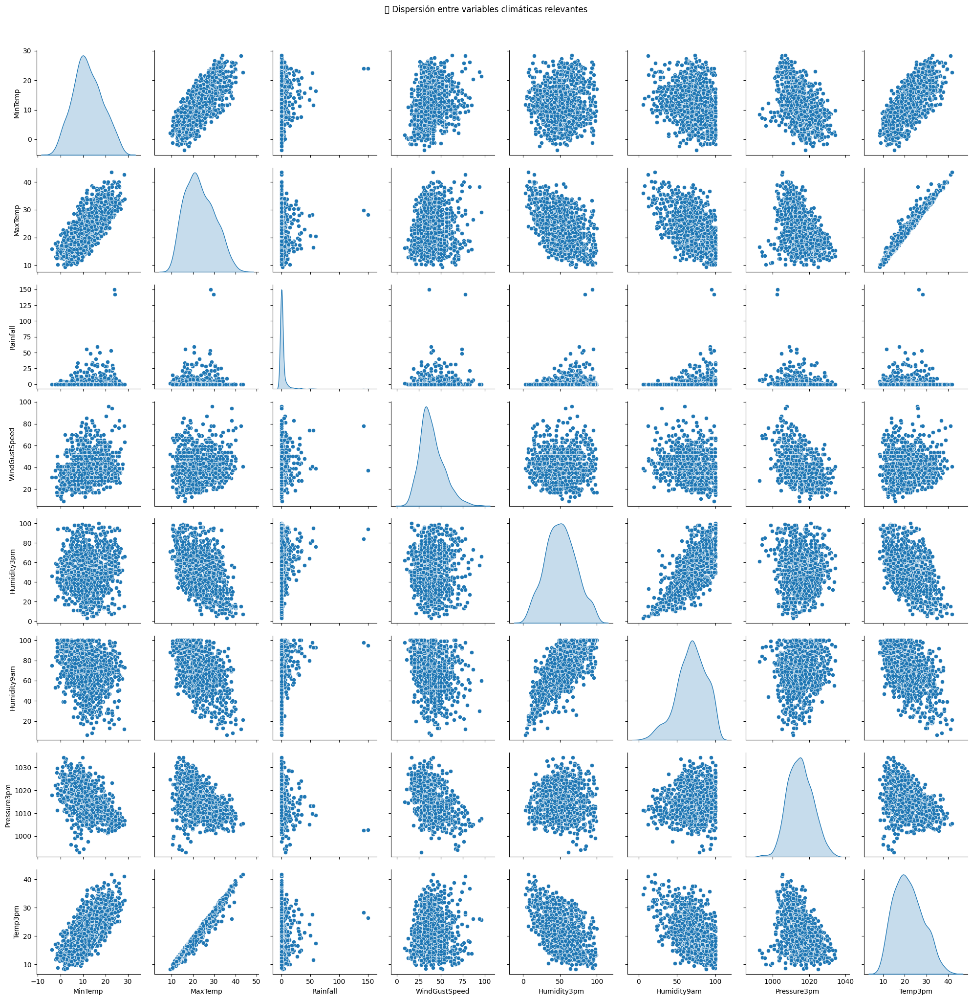

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Selección de columnas de interés para el análisis de dispersión
columnas_interes = [
    'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed',
    'Humidity3pm', 'Humidity9am', 'Pressure3pm', 'Temp3pm'
]

# Asegurar que las columnas existen en el dataset
columnas_validas = [col for col in columnas_interes if col in df.columns]

# Definición de df_dispersion con solo las columnas válidas
df_dispersion = df[columnas_validas].replace([np.inf, -np.inf], np.nan).dropna()

# Verifica contenido
print("📏 Dimensiones:", df_dispersion.shape)
print("📌 Columnas:", df_dispersion.columns)
print("🧼 Nulos por columna:\n", df_dispersion.isnull().sum())

# Opcional: muestra representativa si es muy grande
df_sample = df_dispersion.sample(n=1000, random_state=42)

# Pairplot
sns.pairplot(df_sample, diag_kind='kde')
plt.suptitle("🌦️ Dispersión entre variables climáticas relevantes", y=1.02)
plt.tight_layout()
plt.show()


Variables numéricas: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'RISK_MM', 'is_duplicated']


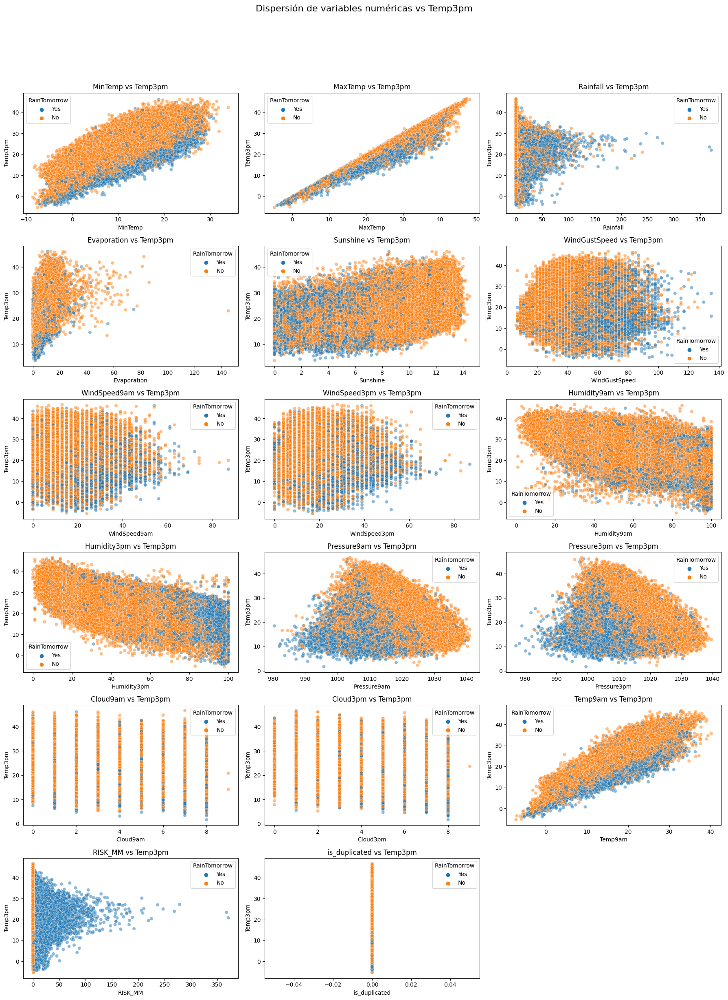

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurar que estamos viendo algo
numeric_vars = df.select_dtypes(include=["float64", "int64"]).columns.tolist()
vars_all = [v for v in numeric_vars if v not in ['Temp3pm', 'RainTomorrow']]

print("Variables numéricas:", vars_all)

# Prevenir errores por nulos
df_plot = df.dropna(subset=['Temp3pm', 'RainTomorrow'])

# Parámetros del gráfico
cols = 3
rows = -(-len(vars_all) // cols)  # ceil

plt.figure(figsize=(6 * cols, 4 * rows))

for i, var in enumerate(vars_all):
    plt.subplot(rows, cols, i + 1)
    sns.scatterplot(data=df_plot, x=var, y='Temp3pm', hue='RainTomorrow', alpha=0.5)
    plt.title(f'{var} vs Temp3pm')
    plt.xlabel(var)
    plt.ylabel('Temp3pm')

plt.suptitle("Dispersión de variables numéricas vs Temp3pm", y=1.02, fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


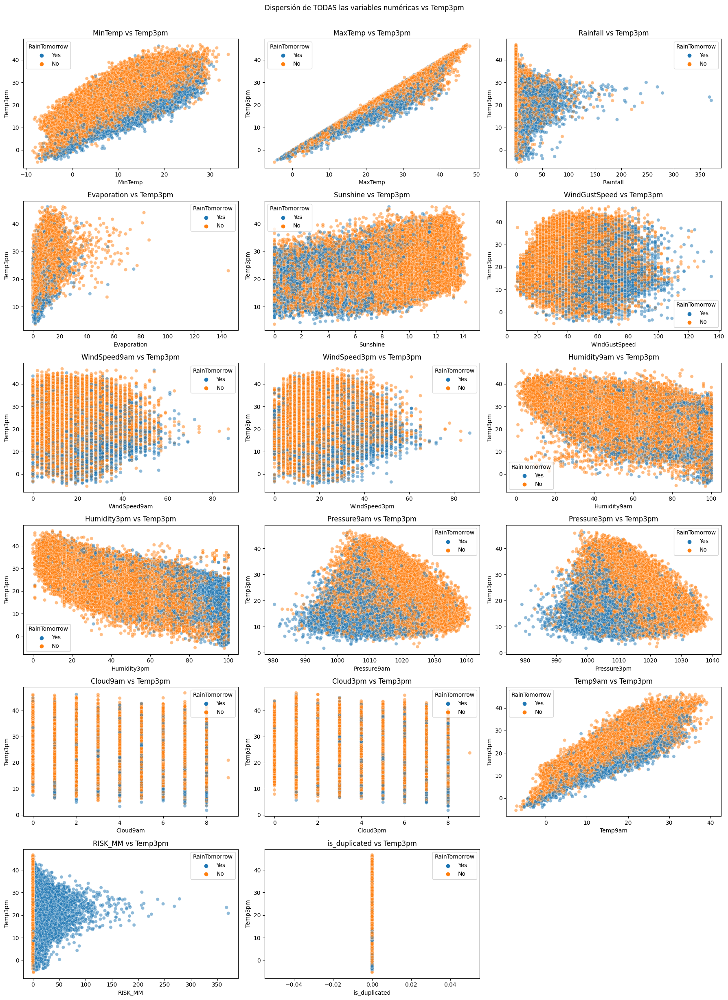

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Variables numéricas menos la target y y
numeric_vars = df.select_dtypes(include=["float64", "int64"]).columns.tolist()
vars_all = [v for v in numeric_vars if v not in ['Temp3pm', 'RainTomorrow']]

plt.figure(figsize=(6 * 3, 4 * ((len(vars_all) + 2) // 3)))
for i, var in enumerate(vars_all):
    plt.subplot(-(-len(vars_all) // 3), 3, i + 1)
    sns.scatterplot(data=df, x=var, y='Temp3pm', hue='RainTomorrow', alpha=0.5)
    plt.title(f'{var} vs Temp3pm')
    plt.xlabel(var)
    plt.ylabel('Temp3pm')
plt.tight_layout()
plt.suptitle("Dispersión de TODAS las variables numéricas vs Temp3pm", y=1.02)
plt.show()


### 9.2 Dispersión de variables importantes para el negocio

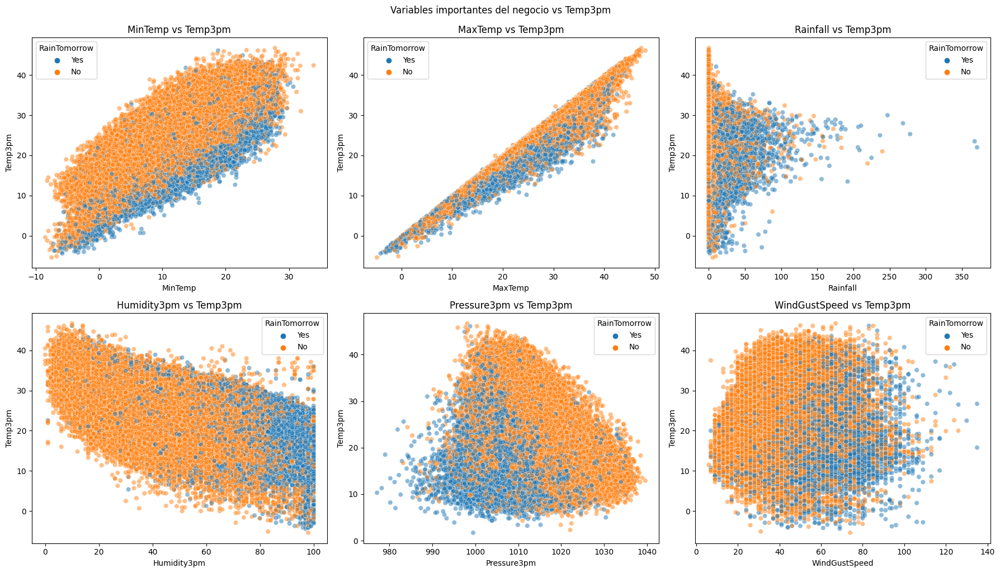

In [26]:
variables_business = ['MinTemp', 'MaxTemp', 'Rainfall', 'Humidity3pm', 'Pressure3pm', 'WindGustSpeed']

plt.figure(figsize=(18, 10))
for i, var in enumerate(variables_business):
    plt.subplot(2, 3, i + 1)
    sns.scatterplot(data=df, x=var, y='Temp3pm', hue='RainTomorrow', alpha=0.5)
    plt.title(f'{var} vs Temp3pm')
    plt.xlabel(var)
    plt.ylabel('Temp3pm')
plt.tight_layout()
plt.suptitle("Variables importantes del negocio vs Temp3pm", y=1.02)
plt.show()

### 9.3 Dispersión de variables seleccionadas para el modelo

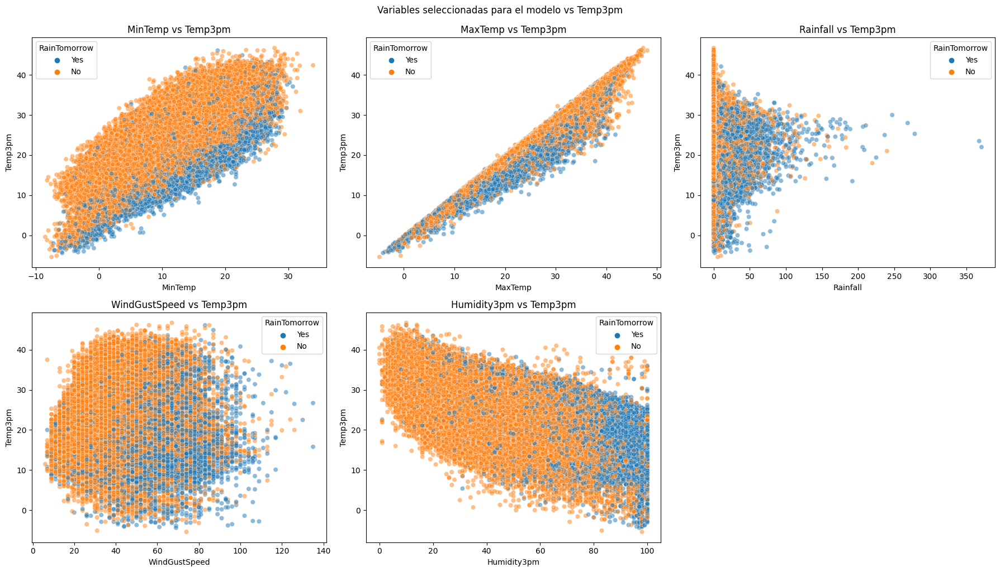

In [27]:
variables_finales = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'Humidity3pm', 'Temp3pm']

plt.figure(figsize=(18, 10))
for i, var in enumerate(variables_finales):
    if var != 'Temp3pm':
        plt.subplot(2, 3, i + 1)
        sns.scatterplot(data=df, x=var, y='Temp3pm', hue='RainTomorrow', alpha=0.5)
        plt.title(f'{var} vs Temp3pm')
        plt.xlabel(var)
        plt.ylabel('Temp3pm')
plt.tight_layout()
plt.suptitle("Variables seleccionadas para el modelo vs Temp3pm", y=1.02)
plt.show()

# 10. Boxplots de todas las variables numéricas

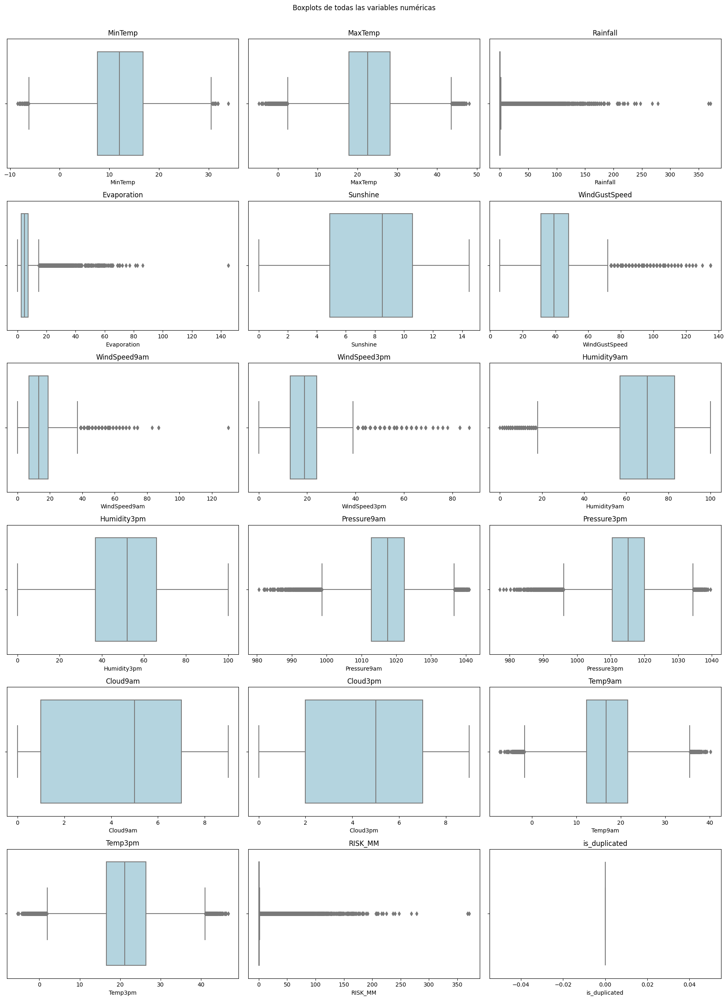

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar columnas numéricas
all_numeric_cols = df.select_dtypes(include=["float64", "int64"]).columns.tolist()

# Grilla de 3 columnas
cols = 3
rows = -(-len(all_numeric_cols) // cols)

plt.figure(figsize=(6 * cols, 4 * rows))

for i, col in enumerate(all_numeric_cols):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(x=df[col], color='lightblue')
    plt.title(f'{col}')

plt.tight_layout()
plt.suptitle("Boxplots de todas las variables numéricas", y=1.02)
plt.show()

### 10.1 Boxplots de variables más importantes para el negocio

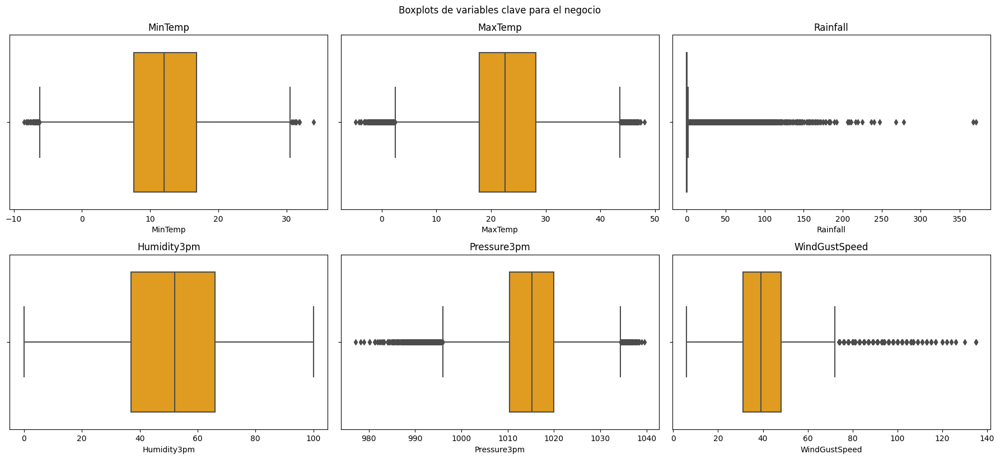

In [29]:
business_vars = ['MinTemp', 'MaxTemp', 'Rainfall', 'Humidity3pm', 'Pressure3pm', 'WindGustSpeed']

plt.figure(figsize=(18, 8))

for i, col in enumerate(business_vars):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(x=df[col], color='orange')
    plt.title(f'{col}')

plt.tight_layout()
plt.suptitle("Boxplots de variables clave para el negocio", y=1.02)
plt.show()

### 10.2 Boxplots de las variables que usaremos en el modelo

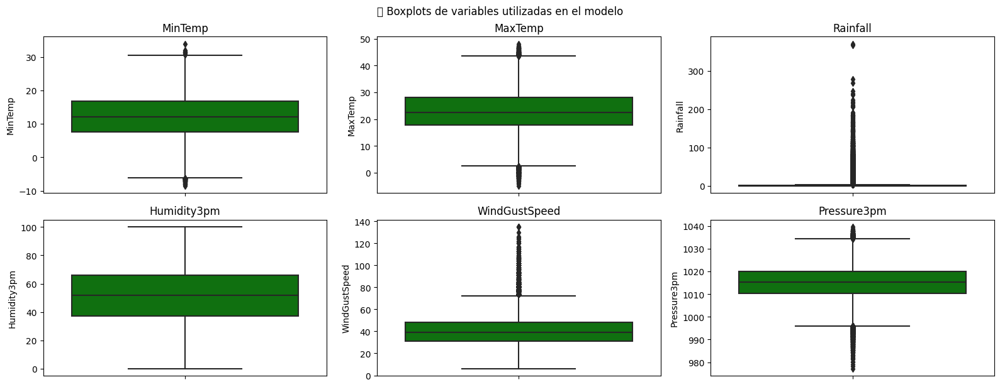

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

model_vars = [
    'MinTemp', 'MaxTemp', 'Rainfall', 'Humidity3pm',
    'WindGustSpeed', 'Pressure3pm'
]

# Forzamos orientación vertical y evitamos warnings
plt.figure(figsize=(16, 6))

for i, col in enumerate(model_vars):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(y=pd.to_numeric(df[col], errors='coerce'), color='green')
    plt.title(f'{col}')

plt.tight_layout()
plt.suptitle("📦 Boxplots de variables utilizadas en el modelo", y=1.02)
plt.show()


## 🔹Fase 3: Preparación de los Datos

# 11. Codificación binaria para RainToday y RainTomorrow (Técnica aplicada a variables binarias)

### Inspección de valores en las columnas RainToday y RainTomorrow

In [31]:
print(df[['RainToday', 'RainTomorrow']].value_counts())
print(df[['RainToday', 'RainTomorrow']].head())


RainToday  RainTomorrow
No         No              92728
Yes        No              16858
No         Yes             16604
Yes        Yes             14597
Name: count, dtype: int64
      RainToday RainTomorrow
44351        No          Yes
44352       Yes          Yes
44353       Yes          Yes
44354       Yes          Yes
44355       Yes           No


### Conversión a formato binario  (Convierte 'Yes'/'No' en 1/0 para variables con solo dos clases)

In [32]:
df['RainToday'] = df['RainToday'].map({'No': 0, 'Yes': 1})
df['RainTomorrow'] = df['RainTomorrow'].map({'No': 0, 'Yes': 1})


### Verificación de la codificación

In [33]:
print(df[['RainToday', 'RainTomorrow']].head())
print(df[['RainToday', 'RainTomorrow']].dtypes)


       RainToday  RainTomorrow
44351        0.0             1
44352        1.0             1
44353        1.0             1
44354        1.0             1
44355        1.0             0
RainToday       float64
RainTomorrow      int64
dtype: object


# 12. Codificación Categórica Multiclase (Técnica de Label Encoding)
#### Aplica codificación numérica a variables categóricas con múltiples clases (sin orden específico)

In [34]:
le = LabelEncoder()
wind_cols = ['WindGustDir', 'WindDir9am', 'WindDir3pm']
for col in wind_cols:
    df[col] = le.fit_transform(df[col].astype(str))
    print(f"\nColumna: {col}")
    print(f"Valores únicos codificados: {df[col].unique()}")
    print(f"Cantidad de clases: {df[col].nunique()}")
    print(df[col].value_counts().sort_index())


Columna: WindGustDir
Valores únicos codificados: [ 7  1 10  9  0  8  3 14  2  4  5  6 12 13 15 16 11]
Cantidad de clases: 17
WindGustDir
0     9071
1     7992
2     7305
3     9033
4     7060
5     6433
6     6561
7     8003
8     8949
9     9309
10    8993
11    8610
12    8797
13    9780
14    8066
15    8901
16    9330
Name: count, dtype: int64

Columna: WindDir9am
Valores únicos codificados: [12  0  3 14 10  9  8 15  5  6  1 11  7  2  4 13 16]
Cantidad de clases: 17
WindDir9am
0      9024
1      7735
2      7558
3     11393
4      7527
5      7948
6      7840
7      8552
8      8493
9      9162
10     8966
11     7448
12     8237
13     8260
14     7194
15     6843
16    10013
Name: count, dtype: int64

Columna: WindDir3pm
Valores únicos codificados: [ 7 13  5  2  0  1 15  4  6  9  8 12 14  3 11 10 16]
Cantidad de clases: 17
WindDir3pm
0      8342
1      7724
2      8382
3      8667
4      8164
5      6444
6      7733
7      8468
8      9598
9     10663
10     9142
11     8010
12 

# 13. Imputación con interpolación lineal 
# (Técnica aplicada a variables continuas con comportamiento temporal)

##### Lista de columnas a interpolar

In [35]:
interpolate_cols = ['Temp3pm', 'MinTemp', 'Pressure3pm', 'Humidity3pm']

##### Verificación por columna

In [36]:
df[interpolate_cols] = df[interpolate_cols].interpolate(method='linear', limit_direction='forward')

## Paso previo obligatorio: crear el df_temp

In [37]:
df_temp = pd.read_csv('../data/01_raw/weatherAUS.csv')
df_temp['Date'] = pd.to_datetime(df_temp['Date'])
df_temp = df_temp.sort_values('Date')

## Lista de columnas a interpolar

In [38]:
interpolate_cols = ['Temp3pm', 'MinTemp', 'Pressure3pm', 'Humidity3pm']

## Verificación por columna

In [39]:
# Verificación por columna
for col in interpolate_cols:
    print(f"\n===============================================")
    print(f"🔍 Columna: {col}")
    
    print(f"❗ Valores nulos antes: {df_temp[col].isnull().sum()}")
    
    print(f"\n🔎 Primeros registros con NaN en {col}:")
    print(df_temp[df_temp[col].isnull()][[col]].head())

    df_temp[col] = df_temp[col].interpolate(method='linear', limit_direction='forward')

    print(f"\n✅ Valores nulos después: {df_temp[col].isnull().sum()}")

    print(f"\n🧪 Primeros valores interpolados (ya no deberían haber NaN):")
    print(df_temp.loc[df_temp[col].notnull(), [col]].head(10))


🔍 Columna: Temp3pm
❗ Valores nulos antes: 2726

🔎 Primeros registros con NaN en Temp3pm:
       Temp3pm
81717      NaN
50767      NaN
14738      NaN
50771      NaN
14743      NaN

✅ Valores nulos después: 0

🧪 Primeros valores interpolados (ya no deberían haber NaN):
       Temp3pm
44351     23.6
44352     25.7
44353     20.2
44354     14.1
44355     15.4
44356     14.8
44357     17.3
44358     15.5
44359     18.9
44360     21.7

🔍 Columna: MinTemp
❗ Valores nulos antes: 637

🔎 Primeros registros con NaN en MinTemp:
       MinTemp
93937      NaN
81815      NaN
14735      NaN
41368      NaN
14741      NaN

✅ Valores nulos después: 0

🧪 Primeros valores interpolados (ya no deberían haber NaN):
       MinTemp
44351      8.0
44352     14.0
44353     13.7
44354     13.3
44355      7.6
44356      6.2
44357      6.1
44358      8.3
44359      8.8
44360      8.4

🔍 Columna: Pressure3pm
❗ Valores nulos antes: 13981

🔎 Primeros registros con NaN en Pressure3pm:
       Pressure3pm
81717          

# 14. Imputación con mediana 
# (Técnica aplicada a columnas numéricas con valores extremos)

### 📌 14.1 Imputación con mediana – Verificación completa de columna: Rainfall

* #### Mostrar cantidad de valores nulos antes

In [40]:
print("🔍 Valores nulos antes:", df['Rainfall'].isnull().sum())

🔍 Valores nulos antes: 1406


* #### Mostrar primeros registros con NaN antes de imputar

In [41]:
print("🔎 Primeros registros con NaN antes de imputar:")
print(df[df['Rainfall'].isnull()][['Rainfall']].head())

🔎 Primeros registros con NaN antes de imputar:
       Rainfall
93860       NaN
93865       NaN
93870       NaN
93875       NaN
93881       NaN


* ## *Aplicar imputación con mediana*

In [42]:
mediana = df['Rainfall'].median()
df['Rainfall'] = df['Rainfall'].fillna(mediana)
print(f"✅ Imputación con la mediana realizada: {mediana}")

✅ Imputación con la mediana realizada: 0.0


* #### Mostrar cantidad de valores nulos después

In [43]:
print("✅ Valores nulos después:", df['Rainfall'].isnull().sum())

✅ Valores nulos después: 0


* #### Mostrar primeros valores ya imputados

In [44]:
print("🧪 Ejemplos de valores después de imputar:")
print(df.loc[df['Rainfall'].notnull(), ['Rainfall']].head(10))

🧪 Ejemplos de valores después de imputar:
       Rainfall
44351       0.0
44352       3.6
44353       3.6
44354      39.8
44355       2.8
44356       0.0
44357       0.2
44358       0.0
44359       0.0
44360      16.2


## 📌 14.2 Imputación con mediana – Verificación completa de columna: WindSpeed9am

* #### Mostrar cantidad de valores nulos antes

In [45]:
print("🔍 Valores nulos antes:", df['WindSpeed9am'].isnull().sum())

🔍 Valores nulos antes: 1348


* #### Mostrar primeros registros con NaN antes de imputar

In [46]:
print("🔎 Primeros registros con NaN antes de imputar:")
print(df[df['WindSpeed9am'].isnull()][['WindSpeed9am']].head())

🔎 Primeros registros con NaN antes de imputar:
       WindSpeed9am
44464           NaN
44469           NaN
44478           NaN
44546           NaN
44564           NaN


* ## *Aplicar imputación con mediana*

In [47]:
mediana = df['WindSpeed9am'].median()
df['WindSpeed9am'] = df['WindSpeed9am'].fillna(mediana)
print(f"✅ Imputación con la mediana realizada: {mediana}")

✅ Imputación con la mediana realizada: 13.0


* #### Mostrar cantidad de valores nulos después

In [48]:
print("✅ Valores nulos después:", df['WindSpeed9am'].isnull().sum())

✅ Valores nulos después: 0


* #### Mostrar primeros valores ya imputados

In [49]:
print("🧪 Ejemplos de valores después de imputar:")
print(df.loc[df['WindSpeed9am'].notnull(), ['WindSpeed9am']].head(10))

🧪 Ejemplos de valores después de imputar:
       WindSpeed9am
44351           6.0
44352           4.0
44353           6.0
44354          30.0
44355          20.0
44356          20.0
44357          19.0
44358          11.0
44359          19.0
44360           7.0


## 📌 14.3 Imputación con mediana – Verificación completa de columna: WindSpeed3pm

* #### Mostrar cantidad de valores nulos antes

In [50]:
print("🔍 Valores nulos antes:", df['WindSpeed3pm'].isnull().sum())

🔍 Valores nulos antes: 2630


* #### Mostrar primeros registros con NaN antes de imputar

In [51]:
print("🔎 Primeros registros con NaN antes de imputar:")
print(df[df['WindSpeed3pm'].isnull()][['WindSpeed3pm']].head())

🔎 Primeros registros con NaN antes de imputar:
       WindSpeed3pm
29542           NaN
81717           NaN
29783           NaN
29792           NaN
50767           NaN


* ## *Aplicar imputación con mediana*

In [52]:
mediana = df['WindSpeed3pm'].median()
df['WindSpeed3pm'] = df['WindSpeed3pm'].fillna(mediana)
print(f"✅ Imputación con la mediana realizada: {mediana}")

✅ Imputación con la mediana realizada: 19.0


* #### Mostrar cantidad de valores nulos después

In [53]:
print("✅ Valores nulos después:", df['WindSpeed3pm'].isnull().sum())

✅ Valores nulos después: 0


* #### Mostrar primeros valores ya imputados

In [54]:
print("🧪 Ejemplos de valores después de imputar:")
print(df.loc[df['WindSpeed3pm'].notnull(), ['WindSpeed3pm']].head(10))

🧪 Ejemplos de valores después de imputar:
       WindSpeed3pm
44351          20.0
44352          17.0
44353           6.0
44354          24.0
44355          28.0
44356          24.0
44357          26.0
44358          24.0
44359          17.0
44360           6.0


# 15. Imputación con moda (Técnica aplicada a columnas categóricas)

## 📌 15.1 Imputación con moda – Verificación completa de columna: ***RainToday***

In [55]:
df[['WindGustDir', 'WindDir9am', 'WindDir3pm']].isnull().sum()


WindGustDir    0
WindDir9am     0
WindDir3pm     0
dtype: int64

* #### Mostrar cantidad de valores nulos antes

In [56]:
print("🔍 Valores nulos antes:", df['RainToday'].isnull().sum())

🔍 Valores nulos antes: 1406


* #### Mostrar primeros registros con NaN antes de imputar

In [57]:
print("🔎 Primeros registros con NaN antes de imputar:")
print(df[df['RainToday'].isnull()][['RainToday']].head())

🔎 Primeros registros con NaN antes de imputar:
       RainToday
93860        NaN
93865        NaN
93870        NaN
93875        NaN
93881        NaN


* ## ***Aplicar imputación con la moda***

In [58]:
# Verificar si hay al menos una moda
moda = df['RainToday'].mode()

if not moda.empty:
    df['RainToday'] = df['RainToday'].fillna(moda[0])
    print(f"✅ Imputación con la moda realizada: {moda[0]}")
else:
    print("❌ No se pudo imputar con la moda porque la columna está vacía o no tiene moda clara.")


✅ Imputación con la moda realizada: 0.0


- #### Mostrar cantidad de valores nulos después

In [59]:
print("✅ Valores nulos después:", df['RainToday'].isnull().sum())

✅ Valores nulos después: 0


* #### Mostrar primeros valores ya imputados

In [60]:
print("🧪 Ejemplos de valores después de imputar:")
print(df.loc[df['RainToday'].notnull(), ['RainToday']].head(10))

🧪 Ejemplos de valores después de imputar:
       RainToday
44351        0.0
44352        1.0
44353        1.0
44354        1.0
44355        1.0
44356        0.0
44357        0.0
44358        0.0
44359        0.0
44360        1.0


## 📌 15.2 Imputación con moda – Verificación completa de columna: ***WindGustDir***


* #### Mostrar cantidad de valores nulos antes

In [61]:
print("🔍 Valores nulos antes:", df['WindGustDir'].isnull().sum())

🔍 Valores nulos antes: 0


* #### Mostrar primeros registros con NaN antes de imputar

In [62]:
print("🔎 Primeros registros con NaN antes de imputar:")
print(df[df['WindGustDir'].isnull()][['WindGustDir']].head())

🔎 Primeros registros con NaN antes de imputar:
Empty DataFrame
Columns: [WindGustDir]
Index: []


* ## *Aplicar imputación con la moda*

In [63]:
moda = df['WindGustDir'].mode()
if not moda.empty:
    df['WindGustDir'] = df['WindGustDir'].fillna(moda[0])
    print(f"✅ Imputación con la moda realizada: {moda[0]}")
else:
    print("❌ No se pudo imputar porque la columna no tiene moda válida.")

✅ Imputación con la moda realizada: 13


* #### Mostrar cantidad de valores nulos después

In [64]:
print("✅ Valores nulos después:", df['WindGustDir'].isnull().sum())

✅ Valores nulos después: 0


* #### Mostrar primeros valores ya imputados

In [65]:
print("🧪 Ejemplos de valores después de imputar:")
print(df.loc[df['WindGustDir'].notnull(), ['WindGustDir']].head(10))

🧪 Ejemplos de valores después de imputar:
       WindGustDir
44351            7
44352            1
44353            7
44354            7
44355           10
44356            9
44357            9
44358            0
44359            8
44360            0


# 📌 15.3 Imputación con moda – Verificación completa de columna: ***WindDir9am***

* #### Mostrar cantidad de valores nulos antes

In [66]:
print("🔍 Valores nulos antes:", df['WindDir9am'].isnull().sum())

🔍 Valores nulos antes: 0


* #### Mostrar primeros registros con NaN antes de imputar

In [67]:
print("🔎 Primeros registros con NaN antes de imputar:")
print(df[df['WindDir9am'].isnull()][['WindDir9am']].head())

🔎 Primeros registros con NaN antes de imputar:
Empty DataFrame
Columns: [WindDir9am]
Index: []


* ## *Aplicar imputación con la moda*

In [68]:
moda = df['WindDir9am'].mode()

if not moda.empty:
    df['WindDir9am'] = df['WindDir9am'].fillna(moda[0])
    print(f"✅ Imputación con la moda realizada: {moda[0]}")
else:
    print("❌ No se pudo imputar porque la columna no tiene moda válida.")

✅ Imputación con la moda realizada: 3


* #### Mostrar cantidad de valores nulos después

In [69]:
print("✅ Valores nulos después:", df['WindDir9am'].isnull().sum())

✅ Valores nulos después: 0


* #### Mostrar primeros valores ya imputados

In [70]:
print("🧪 Ejemplos de valores después de imputar:")
print(df.loc[df['WindDir9am'].notnull(), ['WindDir9am']].head(10))

🧪 Ejemplos de valores después de imputar:
       WindDir9am
44351          12
44352           0
44353           3
44354          14
44355          10
44356           9
44357           9
44358           9
44359           0
44360           8


# 📌 15.4 Imputación con moda – Verificación completa de columna: ***WindDir3pm***

* #### Mostrar cantidad de valores nulos antes

In [71]:
print("🔍 Valores nulos antes:", df['WindDir3pm'].isnull().sum())

🔍 Valores nulos antes: 0


* #### Mostrar primeros registros con NaN antes de imputar

In [72]:
print("🔎 Primeros registros con NaN antes de imputar:")
print(df[df['WindDir3pm'].isnull()][['WindDir3pm']].head())

🔎 Primeros registros con NaN antes de imputar:
Empty DataFrame
Columns: [WindDir3pm]
Index: []


* ## *Aplicar imputación con la moda*

In [73]:
moda = df['WindDir3pm'].mode()

if not moda.empty:
    df['WindDir3pm'] = df['WindDir3pm'].fillna(moda[0])
    print(f"✅ Imputación con la moda realizada: {moda[0]}")
else:
    print("❌ No se pudo imputar porque la columna no tiene moda válida.")

✅ Imputación con la moda realizada: 9


* #### Mostrar cantidad de valores nulos después

In [74]:
print("✅ Valores nulos después:", df['WindDir3pm'].isnull().sum())

✅ Valores nulos después: 0


* #### Mostrar primeros valores ya imputados

In [75]:
print("🧪 Ejemplos de valores después de imputar:")
print(df.loc[df['WindDir3pm'].notnull(), ['WindDir3pm']].head(10))

🧪 Ejemplos de valores después de imputar:
       WindDir3pm
44351           7
44352          13
44353           5
44354          13
44355           2
44356           0
44357           2
44358           0
44359           1
44360           2


# 16. Imputación avanzada (sin eliminar columnas)

### 🔹 16.1 Interpolación lineal adicional

In [76]:
cols_lineales = ['MaxTemp', 'Pressure9am', 'Humidity9am', 'Temp9am']

print("📊 Valores nulos antes de interpolación:")
print(df[cols_lineales].isnull().sum())

# Interpolación lineal solo en las columnas seleccionadas
df[cols_lineales] = df[cols_lineales].interpolate(method='linear', limit_direction='forward')

print("✅ Valores nulos después de interpolación:")
print(df[cols_lineales].isnull().sum())

📊 Valores nulos antes de interpolación:
MaxTemp          322
Pressure9am    14014
Humidity9am     1774
Temp9am          904
dtype: int64
✅ Valores nulos después de interpolación:
MaxTemp        0
Pressure9am    0
Humidity9am    0
Temp9am        0
dtype: int64


### 🔹 16.2 Imputación con mediana para WindGustSpeed

In [77]:
print("❌ Valores nulos antes de imputar WindGustSpeed:", df['WindGustSpeed'].isnull().sum())

# Cálculo y aplicación de mediana
mediana_wind = df['WindGustSpeed'].median()
df['WindGustSpeed'] = df['WindGustSpeed'].fillna(mediana_wind)

print(f"✅ Imputación con mediana realizada: {mediana_wind}")
print("🧼 Valores nulos después:", df['WindGustSpeed'].isnull().sum())


❌ Valores nulos antes de imputar WindGustSpeed: 9270
✅ Imputación con mediana realizada: 39.0
🧼 Valores nulos después: 0


### 🔹 16.3 Moda para Cloud3pm y Cloud9am

In [78]:
# Imputación segura con moda
for col in ['Cloud3pm', 'Cloud9am']:
    print(f"\n📊 Antes de imputar {col}: {df[col].isnull().sum()} valores nulos")
    moda = df[col].mode()

    if not moda.empty:
        df[col] = df[col].fillna(moda[0])
        print(f"✅ Imputación con moda realizada para {col}: {moda[0]}")
    else:
        print(f"❌ No se pudo imputar {col} porque no tiene moda válida")

print("\n🧼 Valores nulos después de imputar nubes:")
print(df[['Cloud3pm', 'Cloud9am']].isnull().sum())



📊 Antes de imputar Cloud3pm: 57094 valores nulos
✅ Imputación con moda realizada para Cloud3pm: 7.0

📊 Antes de imputar Cloud9am: 53657 valores nulos
✅ Imputación con moda realizada para Cloud9am: 7.0

🧼 Valores nulos después de imputar nubes:
Cloud3pm    0
Cloud9am    0
dtype: int64


### 🔹 16.4 KNN Imputer para Sunshine y Evaporation

##### ⚙️ ***Importación de modelo KNN Imputer desde Scikit-learn (requerido para imputación avanzada)***

In [79]:
from sklearn.impute import KNNImputer

* ### Mostrar valores nulos antes de aplicar KNN

In [80]:
print("🔍 Antes de KNN:")
print(df[['Sunshine', 'Evaporation']].isnull().sum())

🔍 Antes de KNN:
Sunshine       67816
Evaporation    60843
dtype: int64


* ### 🔹 16.5 Aplicación de KNN Imputer

In [81]:
knn_imputer = KNNImputer(n_neighbors=5)
df[['Sunshine', 'Evaporation']] = knn_imputer.fit_transform(df[['Sunshine', 'Evaporation']])

* ## Mostrar valores nulos después de aplicar KNN

In [82]:
print("\n✅ Después de KNN:")
print(df[['Sunshine', 'Evaporation']].isnull().sum())


✅ Después de KNN:
Sunshine       0
Evaporation    0
dtype: int64


* ## Mostrar ejemplos de imputación realizados

In [83]:
print("\n🧪 Ejemplos imputados:")
print(df[['Sunshine', 'Evaporation']].iloc[44351:44361])


🧪 Ejemplos imputados:
         Sunshine  Evaporation
36769    9.700000     0.400000
60666    2.900000     0.800000
133851  11.000000     5.400000
51626    7.624853     5.469824
130823   7.624853     5.469824
127787   6.500000     0.200000
3902     7.624853     5.469824
97907    2.000000     0.400000
6865     6.100000     1.600000
106929   9.700000     1.800000


In [84]:
# Verificar si existen valores nulos
print("🔍 Valores nulos por columna:")
print(df.isnull().sum())

# Verificar duplicados
print("\n📛 Total de registros duplicados:")
print(df.duplicated().sum())

# Verificar tipos de datos
print("\n🔠 Tipos de datos:")
print(df.dtypes)

# Tamaño del dataset
print("\n📏 Dimensión del dataset:")
print(df.shape)


🔍 Valores nulos por columna:
Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RISK_MM          0
RainTomorrow     0
Month            0
DayOfWeek        0
is_duplicated    0
dtype: int64

📛 Total de registros duplicados:
0

🔠 Tipos de datos:
Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir               int64
WindGustSpeed           float64
WindDir9am                int64
WindDir3pm                int64
WindSpeed9am            float64
WindSp

# 17. Guardar dataset limpio 

* #### 17.1 Como CSV

In [85]:
df.to_csv('../data/02_intermediate/processed_weather_data.csv', index=False)

In [86]:
print("✅ Dataset limpio guardado exitosamente como CSV en /02_intermediate/")

✅ Dataset limpio guardado exitosamente como CSV en /02_intermediate/


* #### 17.2 Como Parquet

In [87]:
df.to_parquet('../data/02_intermediate/processed_weather_data.parquet', index=False)


In [88]:
import os

ruta_archivo = '../data/02_intermediate/processed_weather_data.parquet'

if os.path.exists(ruta_archivo):
    print("✅ ¡El archivo fue guardado correctamente!")
else:
    print("❌ El archivo NO se encuentra en la ruta esperada.")


✅ ¡El archivo fue guardado correctamente!


# 18. Guardar dataset limpio final

In [89]:
# Guardar el DataFrame limpio final como Parquet en carpeta 03_primary
df.to_parquet('../data/03_primary/weather_cleaned.parquet', index=False)
print("✅ Dataset limpio final guardado exitosamente en /03_primary/")


✅ Dataset limpio final guardado exitosamente en /03_primary/


In [90]:
import os

ruta_final = '../data/03_primary/weather_cleaned.parquet'

if os.path.exists(ruta_final):
    print("✅ ¡El archivo final fue guardado correctamente en 03_primary!")
else:
    print("❌ El archivo NO se encuentra en la ruta esperada.")


✅ ¡El archivo final fue guardado correctamente en 03_primary!


In [91]:
df = pd.read_parquet('../data/03_primary/weather_cleaned.parquet')

In [92]:
print("📏 Dimensiones:", df.shape)
print("\n🔠 Tipos de datos:")
print(df.dtypes)
print("\n📊 Estadísticas descriptivas:")
print(df.describe())


📏 Dimensiones: (142193, 27)

🔠 Tipos de datos:
Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir               int64
WindGustSpeed           float64
WindDir9am                int64
WindDir3pm                int64
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday               float64
RISK_MM                 float64
RainTomorrow              int64
Month                     int32
DayOfWeek                 int32
is_duplicated             int64
dtype: object

📊 Estadísticas descriptivas:
                                Date        M

In [93]:
print("🧼 Nulos por columna:\n", df.isnull().sum())
print("📛 Duplicados:", df.duplicated().sum())


🧼 Nulos por columna:
 Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RISK_MM          0
RainTomorrow     0
Month            0
DayOfWeek        0
is_duplicated    0
dtype: int64
📛 Duplicados: 0


# 🔷 19 Análisis de Distribución, Outliers y Correlaciones

## 19.1 Distribución y outliers por variable numérica

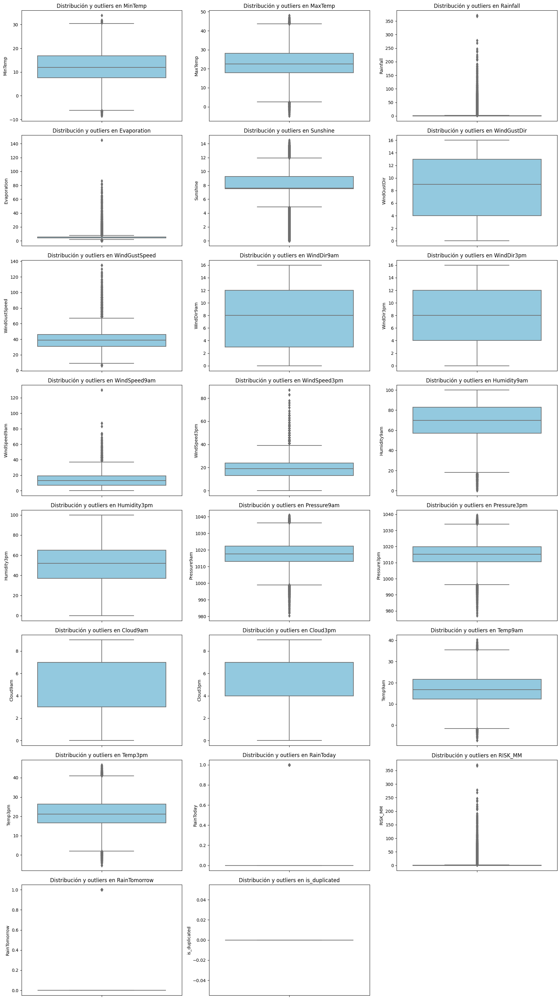

In [94]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionamos todas las variables numéricas del dataset
numeric_columns = df.select_dtypes(include=["float64", "int64"]).columns.tolist()

# Tamaño de figura dinámico según cantidad de variables
cols = 3
rows = -(-len(numeric_columns) // cols)  # equivalente a math.ceil
plt.figure(figsize=(6 * cols, 4 * rows))

for i, column in enumerate(numeric_columns):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(data=df, y=column, color='skyblue')
    plt.title(f'Distribución y outliers en {column}')
    plt.xlabel('')
    plt.ylabel(column)

plt.tight_layout()
plt.show()


## 19.2 Frecuencia de registros por ubicación

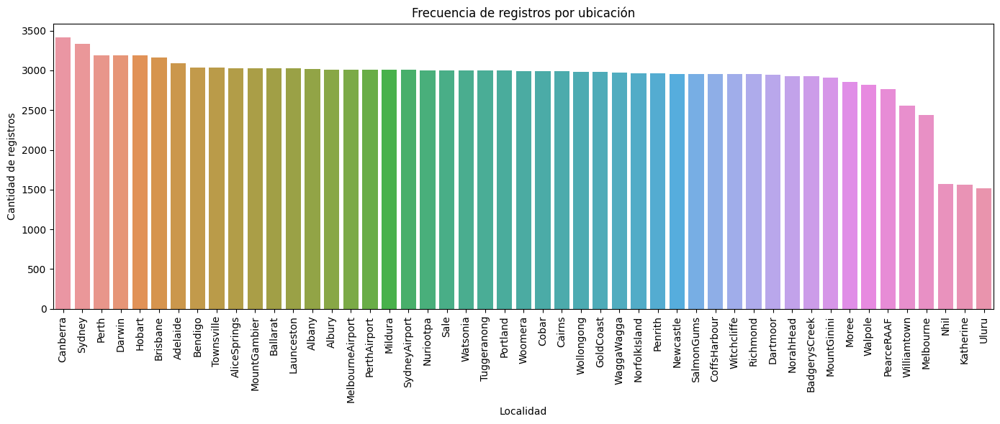

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 6))
sns.countplot(data=df, x='Location', order=df['Location'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Frecuencia de registros por ubicación')
plt.xlabel('Localidad')
plt.ylabel('Cantidad de registros')
plt.tight_layout()
plt.show()


## 19.3 Correlación de variables con 'RainTomorrow'

🔗 Correlación de variables con 'RainTomorrow':

RISK_MM          0.501485
Humidity3pm      0.438281
RainToday        0.306555
Humidity9am      0.255779
Cloud3pm         0.239996
Rainfall         0.235087
WindGustSpeed    0.224766
Cloud9am         0.209961
WindSpeed9am     0.090446
WindSpeed3pm     0.086973
MinTemp          0.083520
WindGustDir      0.054488
WindDir3pm       0.034435
WindDir9am       0.018436
Month            0.007328
DayOfWeek       -0.001707
Temp9am         -0.025970
Evaporation     -0.095822
MaxTemp         -0.159148
Temp3pm         -0.188816
Pressure3pm     -0.211780
Pressure9am     -0.230200
Sunshine        -0.325780
is_duplicated         NaN
Name: RainTomorrow, dtype: float64


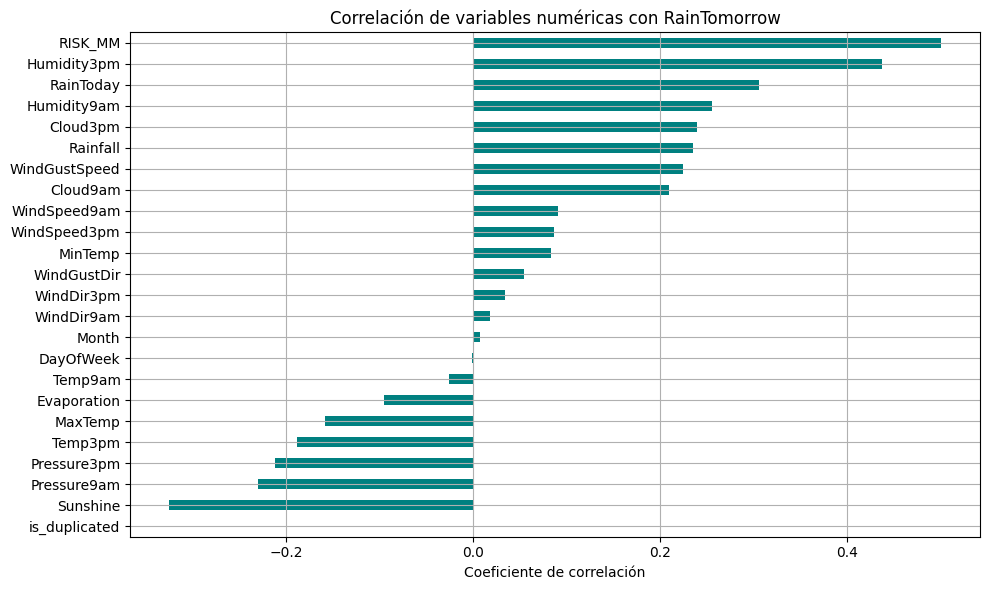

In [96]:
# Calcular correlación
correlations = df.corr(numeric_only=True)['RainTomorrow'].drop('RainTomorrow').sort_values(ascending=False)

# Mostrar como tabla ordenada
print("🔗 Correlación de variables con 'RainTomorrow':\n")
print(correlations)

# Opcional: gráfico de barras
plt.figure(figsize=(10, 6))
correlations.plot(kind='barh', color='teal')
plt.title("Correlación de variables numéricas con RainTomorrow")
plt.xlabel("Coeficiente de correlación")
plt.grid(True)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


## 19.4 Estacionalidad del promedio de lluvia

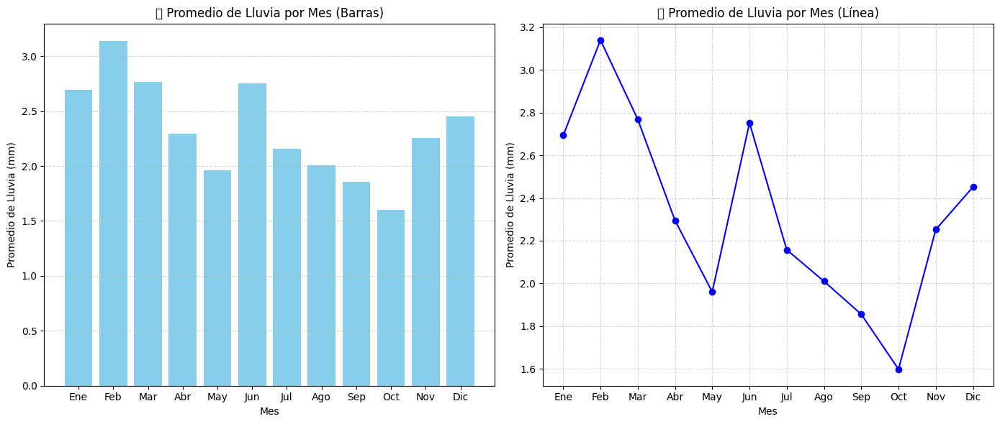

In [97]:
import matplotlib.pyplot as plt

# ✅ Agrupar por mes y calcular promedio de lluvia
rainfall_by_month = df.groupby('Month')['Rainfall'].mean().sort_index()

# Etiquetas de los meses
month_labels = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun',
                'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

# 📊 Visualización combinada
plt.figure(figsize=(14, 6))

# Gráfico de barras
plt.subplot(1, 2, 1)
plt.bar(range(1, 13), rainfall_by_month.values, color='skyblue')
plt.title("🌧️ Promedio de Lluvia por Mes (Barras)")
plt.xlabel("Mes")
plt.ylabel("Promedio de Lluvia (mm)")
plt.xticks(ticks=range(1, 13), labels=month_labels)
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Gráfico de líneas
plt.subplot(1, 2, 2)
plt.plot(range(1, 13), rainfall_by_month.values, marker='o', linestyle='-', color='blue')
plt.title("📈 Promedio de Lluvia por Mes (Línea)")
plt.xlabel("Mes")
plt.ylabel("Promedio de Lluvia (mm)")
plt.xticks(ticks=range(1, 13), labels=month_labels)
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


## 19.5 Distribución de la variable objetivo 'RainTomorrow'

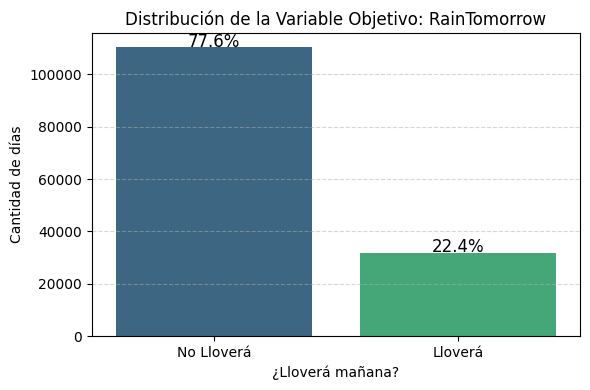

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt

# Contar la frecuencia de valores 0 y 1
rain_counts = df['RainTomorrow'].value_counts().sort_index()

# Gráfico de barras
plt.figure(figsize=(6, 4))
sns.barplot(x=rain_counts.index, y=rain_counts.values, palette='viridis')

# Etiquetas
plt.xticks([0, 1], ['No Lloverá', 'Lloverá'])
plt.title('Distribución de la Variable Objetivo: RainTomorrow')
plt.xlabel('¿Lloverá mañana?')
plt.ylabel('Cantidad de días')
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Mostrar porcentaje sobre cada barra
total = rain_counts.sum()
for i, v in enumerate(rain_counts.values):
    porcentaje = (v / total) * 100
    plt.text(i, v + 100, f'{porcentaje:.1f}%', ha='center', fontsize=12)

plt.tight_layout()
plt.show()


# 🔷 20. Análisis Climático por Localidad

## 20.1 Proporción de días con lluvia (RainTomorrow = 1) por ubicación

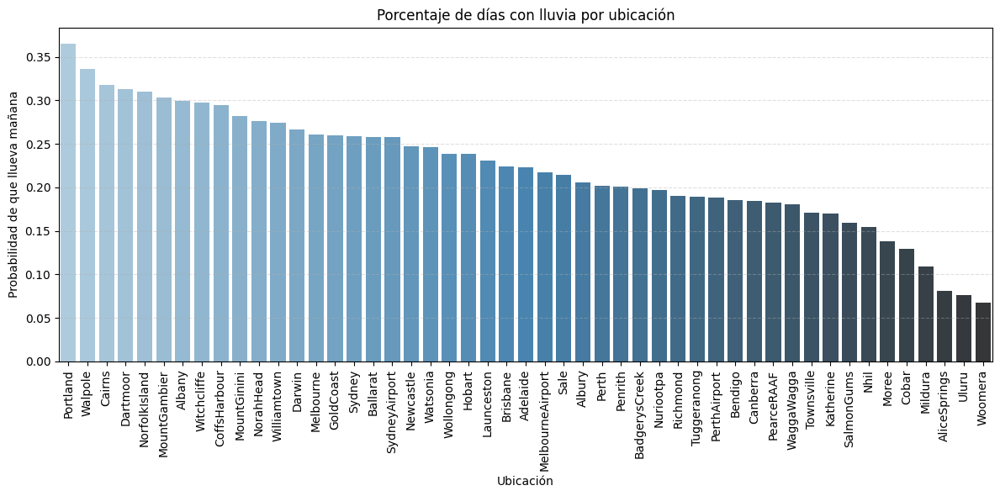

In [99]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculamos el porcentaje de días que llueve por ubicación
rain_by_location = df.groupby("Location")["RainTomorrow"].mean().sort_values(ascending=False)

# Visualización
plt.figure(figsize=(12, 6))
sns.barplot(x=rain_by_location.index, y=rain_by_location.values, palette="Blues_d")

plt.xticks(rotation=90)
plt.title("Porcentaje de días con lluvia por ubicación")
plt.xlabel("Ubicación")
plt.ylabel("Probabilidad de que llueva mañana")
plt.grid(axis="y", linestyle="--", alpha=0.4)

plt.tight_layout()
plt.show()


## 20.2 Promedio de lluvia por localidad

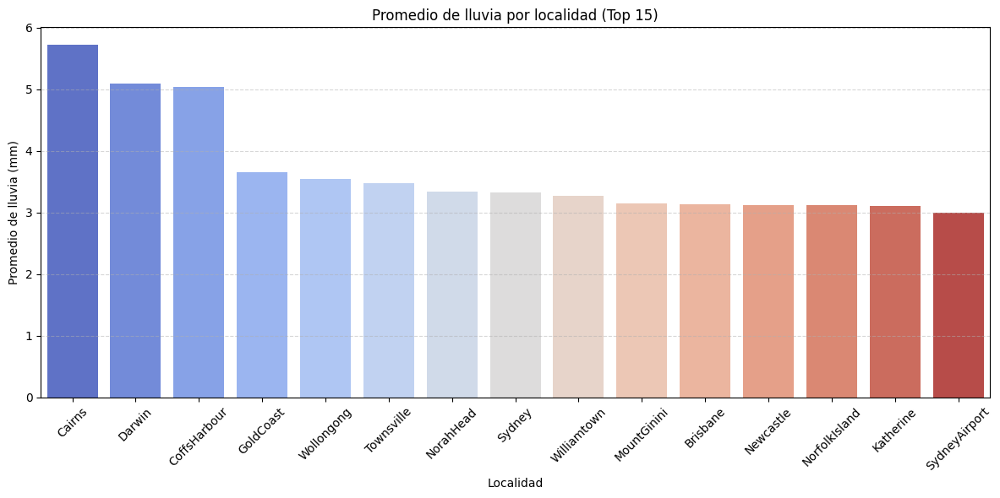

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns


avg_rainfall_by_location = df.groupby('Location')['Rainfall'].mean().sort_values(ascending=False).head(15)

# Gráfico
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_rainfall_by_location.index, y=avg_rainfall_by_location.values, palette='coolwarm')
plt.xticks(rotation=45)
plt.title('Promedio de lluvia por localidad (Top 15)')
plt.xlabel('Localidad')
plt.ylabel('Promedio de lluvia (mm)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 20.3 Promedio de temperatura máxima por localidad 

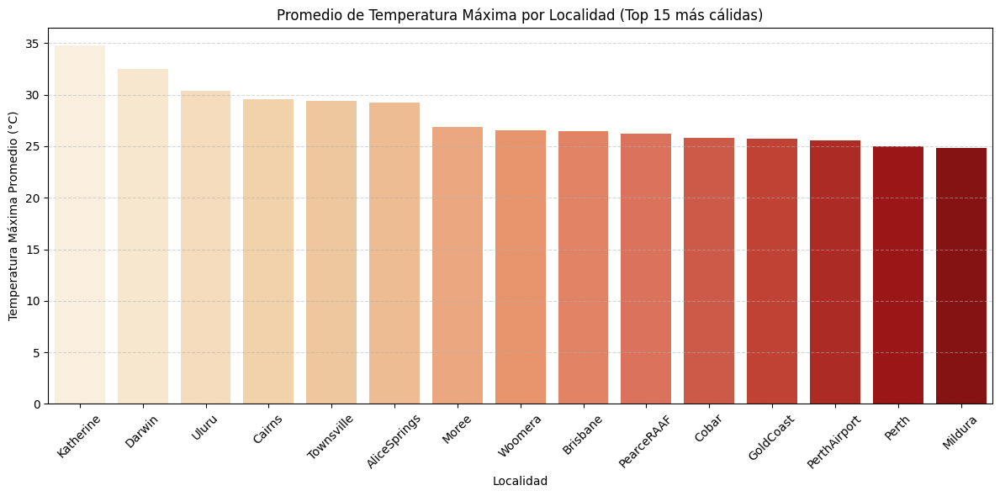

In [101]:
avg_temp_by_location = df.groupby('Location')['MaxTemp'].mean().sort_values(ascending=False).head(15)

# Gráfico
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_temp_by_location.index, y=avg_temp_by_location.values, palette='OrRd')
plt.xticks(rotation=45)
plt.title('Promedio de Temperatura Máxima por Localidad (Top 15 más cálidas)')
plt.xlabel('Localidad')
plt.ylabel('Temperatura Máxima Promedio (°C)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 20.4 Promedio de humedad a las 15:00 hrs por localidad

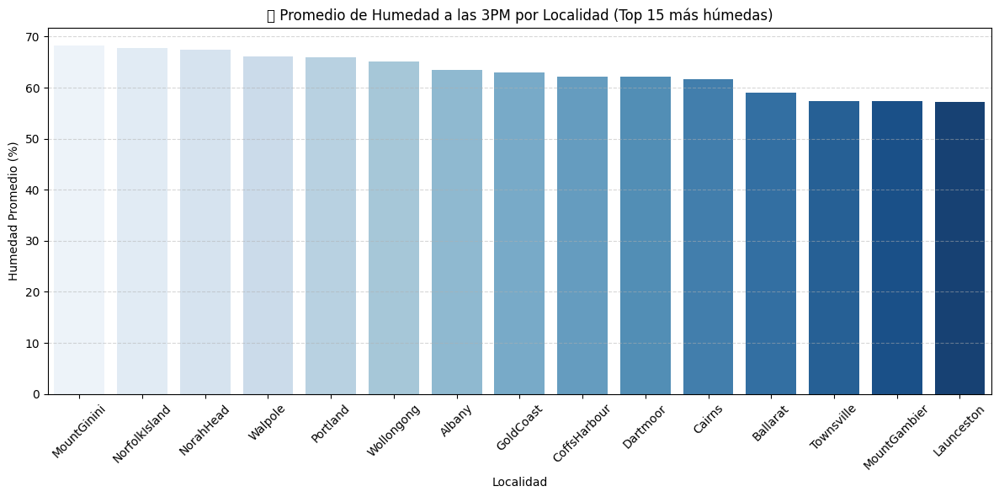

In [102]:
avg_humidity_by_location = df.groupby('Location')['Humidity3pm'].mean().sort_values(ascending=False).head(15)

# Gráfico
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_humidity_by_location.index, y=avg_humidity_by_location.values, palette='Blues')
plt.xticks(rotation=45)
plt.title('💧 Promedio de Humedad a las 3PM por Localidad (Top 15 más húmedas)')
plt.xlabel('Localidad')
plt.ylabel('Humedad Promedio (%)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 20.5 Velocidad del viento a las 15:00 hrs por localidad

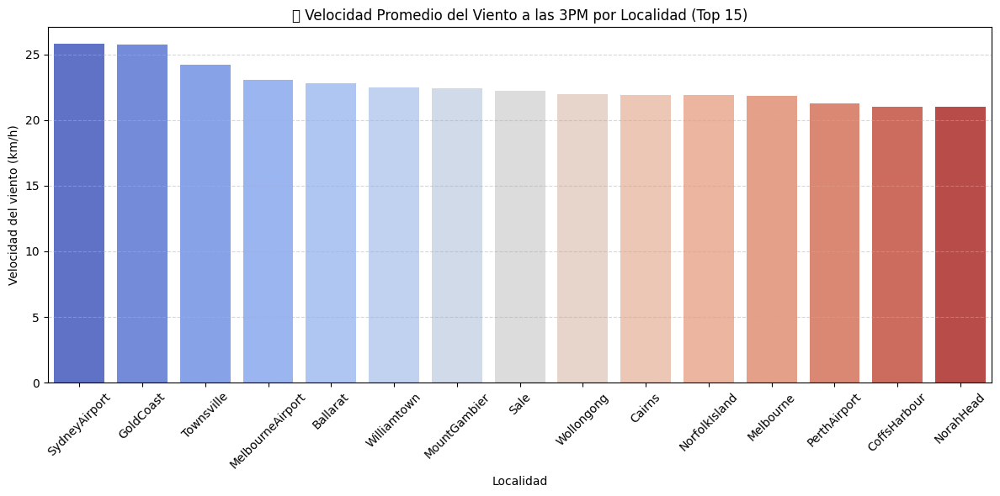

In [103]:

avg_wind_by_location = df.groupby('Location')['WindSpeed3pm'].mean().sort_values(ascending=False).head(15)

# Gráfico
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_wind_by_location.index, y=avg_wind_by_location.values, palette='coolwarm')
plt.xticks(rotation=45)
plt.title('🌬️ Velocidad Promedio del Viento a las 3PM por Localidad (Top 15)')
plt.xlabel('Localidad')
plt.ylabel('Velocidad del viento (km/h)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


# 🔷 21 📆 Análisis mensual por variable climática

## 21.1 Temperatura máxima promedio por mes

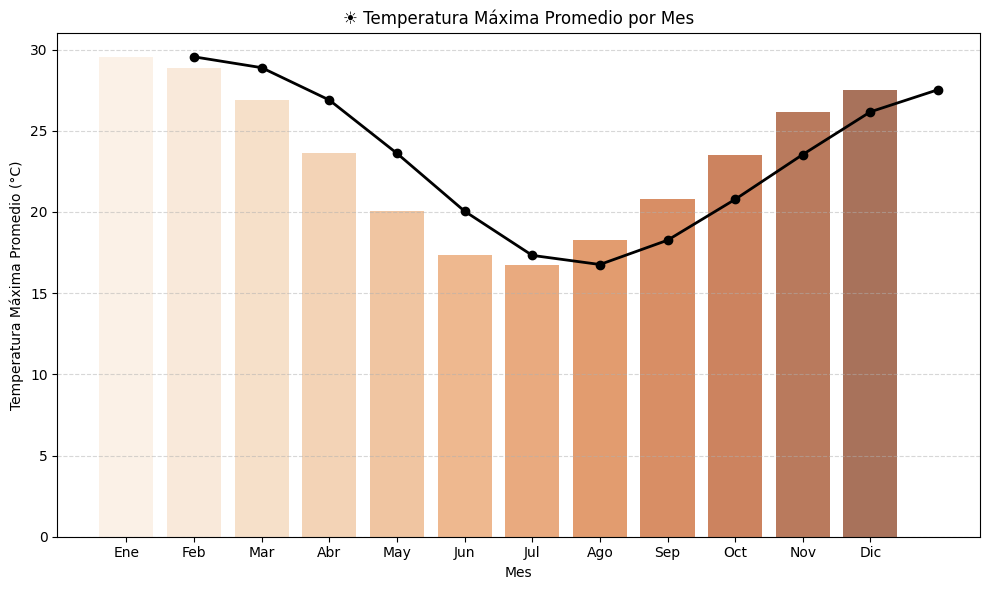

In [104]:
avg_temp_by_month = df.groupby('Month')['MaxTemp'].mean()

# Gráfico combinado: barras + línea
plt.figure(figsize=(10, 6))

# Barras
sns.barplot(x=avg_temp_by_month.index, y=avg_temp_by_month.values, palette="Oranges", alpha=0.7)

# Línea
plt.plot(avg_temp_by_month.index, avg_temp_by_month.values, marker='o', color='black', linewidth=2)

# Personalización
meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
plt.xticks(ticks=range(0, 12), labels=meses)
plt.title('☀️ Temperatura Máxima Promedio por Mes')
plt.xlabel('Mes')
plt.ylabel('Temperatura Máxima Promedio (°C)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 21.2 Promedio mensual de humedad a las 15:00 hrs

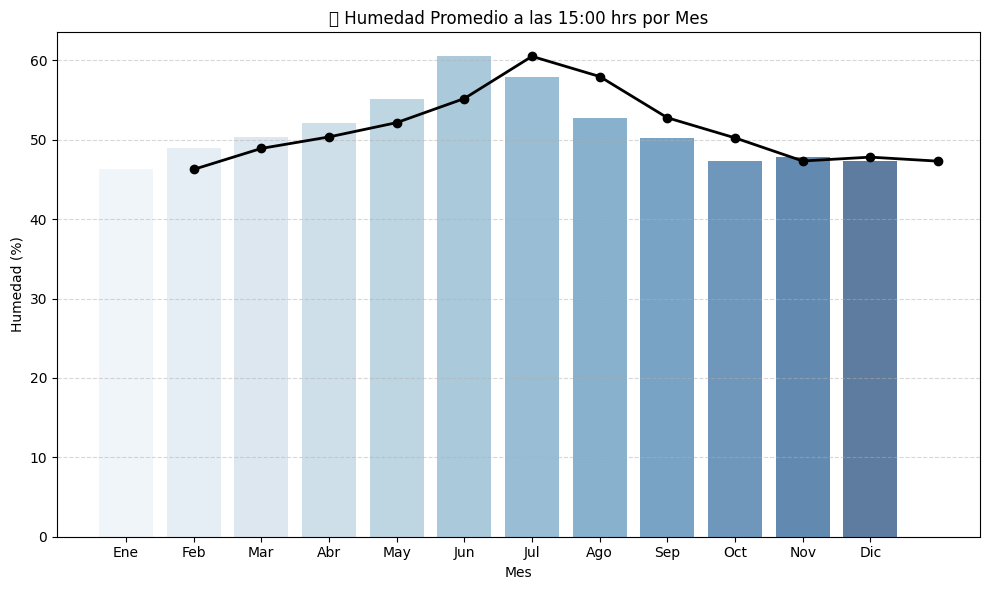

In [105]:

avg_humidity_by_month = df.groupby('Month')['Humidity3pm'].mean()

# Gráfico combinado: barras + línea
plt.figure(figsize=(10, 6))

# Barras
sns.barplot(x=avg_humidity_by_month.index, y=avg_humidity_by_month.values, palette="Blues", alpha=0.7)

# Línea
plt.plot(avg_humidity_by_month.index, avg_humidity_by_month.values, marker='o', color='black', linewidth=2)

# Personalización
meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
plt.xticks(ticks=range(0, 12), labels=meses)
plt.title('💧 Humedad Promedio a las 15:00 hrs por Mes')
plt.xlabel('Mes')
plt.ylabel('Humedad (%)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 21.3 Calcular la velocidad promedio del viento a las 15:00 hrs por mes

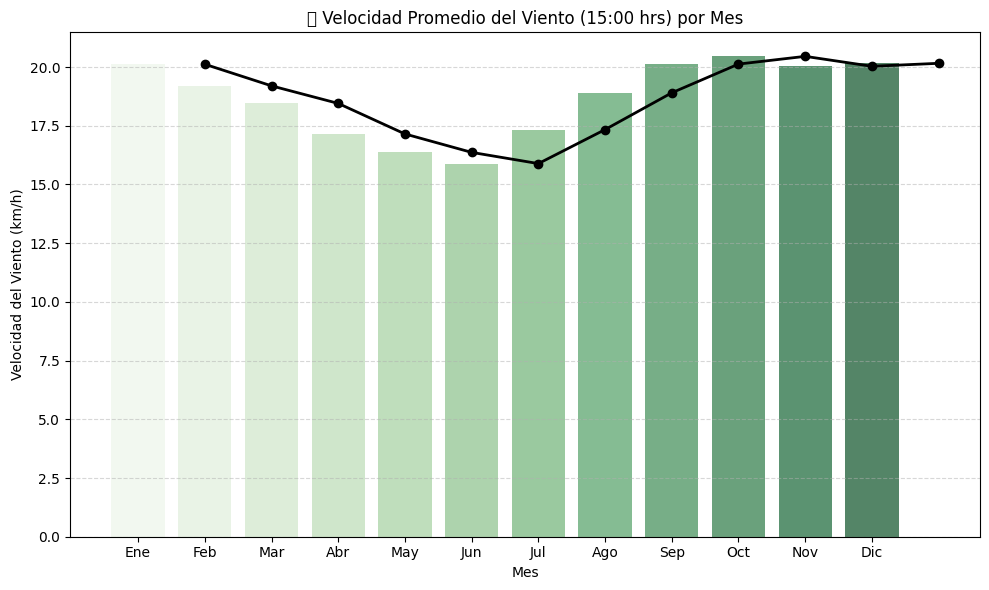

In [106]:
avg_wind_by_month = df.groupby('Month')['WindSpeed3pm'].mean()

# Gráfico combinado: barras + línea
plt.figure(figsize=(10, 6))

# Barras
sns.barplot(x=avg_wind_by_month.index, y=avg_wind_by_month.values, palette="Greens", alpha=0.7)

# Línea
plt.plot(avg_wind_by_month.index, avg_wind_by_month.values, marker='o', color='black', linewidth=2)

# Personalización
meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
plt.xticks(ticks=range(0, 12), labels=meses)
plt.title('🌬️ Velocidad Promedio del Viento (15:00 hrs) por Mes')
plt.xlabel('Mes')
plt.ylabel('Velocidad del Viento (km/h)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 21.4 Temperatura mínima, máxima y a las 3PM por mes

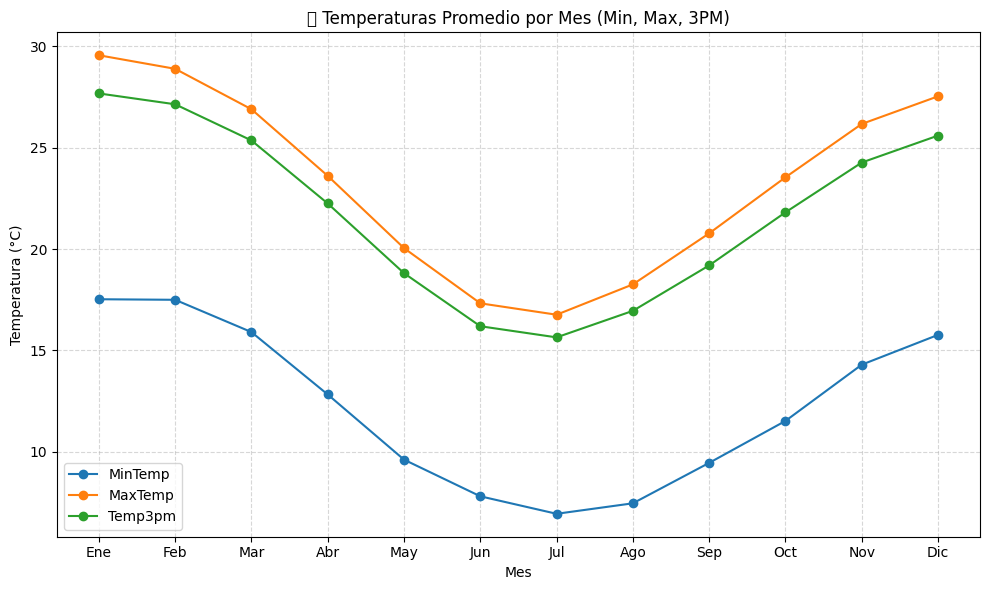

In [107]:
import matplotlib.pyplot as plt

temp_mensual = df.groupby("Month")[["MinTemp", "MaxTemp", "Temp3pm"]].mean()
meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

plt.figure(figsize=(10, 6))
for col in temp_mensual.columns:
    plt.plot(meses, temp_mensual[col], marker='o', label=col)
    
plt.title("🌡️ Temperaturas Promedio por Mes (Min, Max, 3PM)")
plt.xlabel("Mes")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 21.5 Humedad mensual: comparación 9AM vs 3PM

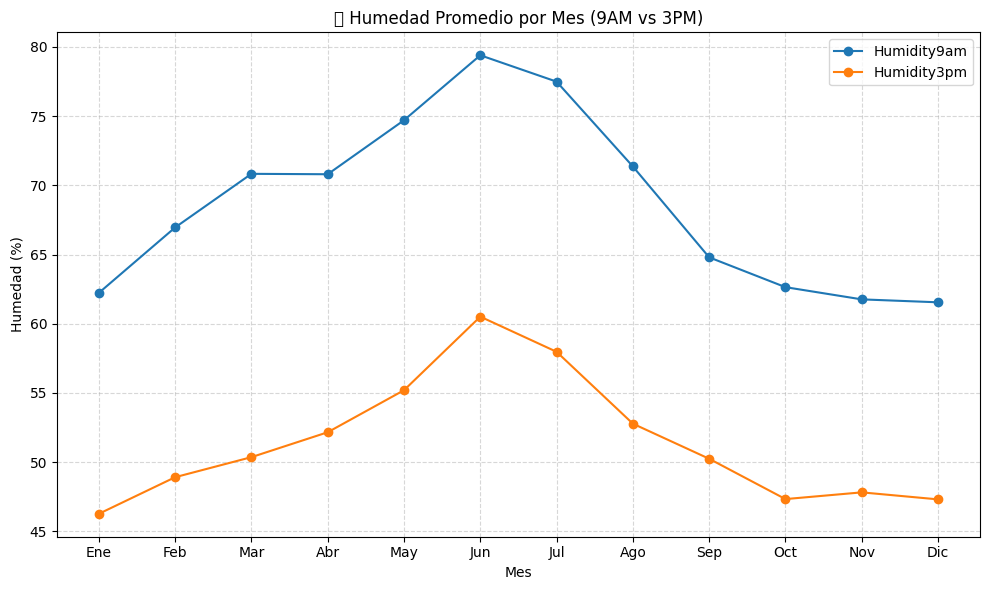

In [108]:
humedad_mensual = df.groupby("Month")[["Humidity9am", "Humidity3pm"]].mean()

plt.figure(figsize=(10, 6))
for col in humedad_mensual.columns:
    plt.plot(meses, humedad_mensual[col], marker='o', label=col)

plt.title("💧 Humedad Promedio por Mes (9AM vs 3PM)")
plt.xlabel("Mes")
plt.ylabel("Humedad (%)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 21.6 Velocidad del viento por mes: 9AM vs 3PM

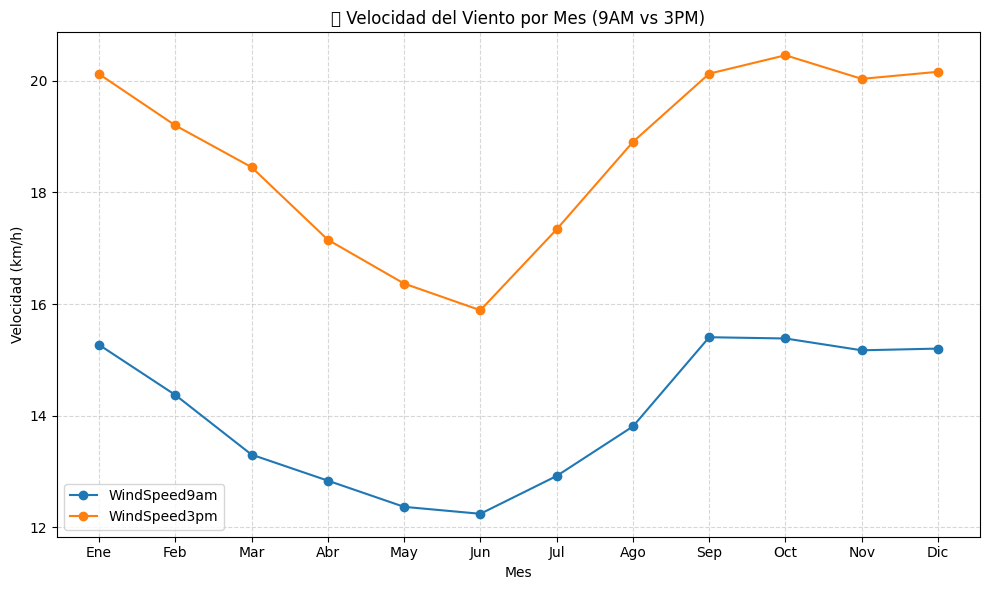

In [109]:
viento_mensual = df.groupby("Month")[["WindSpeed9am", "WindSpeed3pm"]].mean()

plt.figure(figsize=(10, 6))
for col in viento_mensual.columns:
    plt.plot(meses, viento_mensual[col], marker='o', label=col)

plt.title("🌬️ Velocidad del Viento por Mes (9AM vs 3PM)")
plt.xlabel("Mes")
plt.ylabel("Velocidad (km/h)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## 21.7 Presión atmosférica promedio mensual (9AM y 3PM)

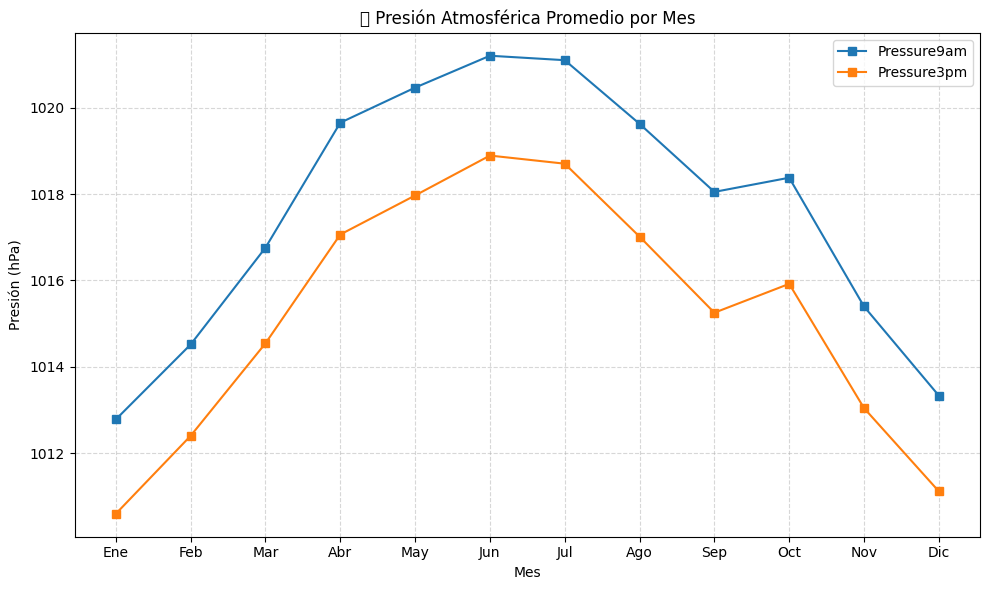

In [110]:
presion_mensual = df.groupby("Month")[["Pressure9am", "Pressure3pm"]].mean()

plt.figure(figsize=(10, 6))
for col in presion_mensual.columns:
    plt.plot(meses, presion_mensual[col], marker='s', label=col)

plt.title("🧭 Presión Atmosférica Promedio por Mes")
plt.xlabel("Mes")
plt.ylabel("Presión (hPa)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


# 🔷 22. Análisis Estacional y Comportamiento Temporal del Clima


## 22.1 Distribución de registros por día de la semana

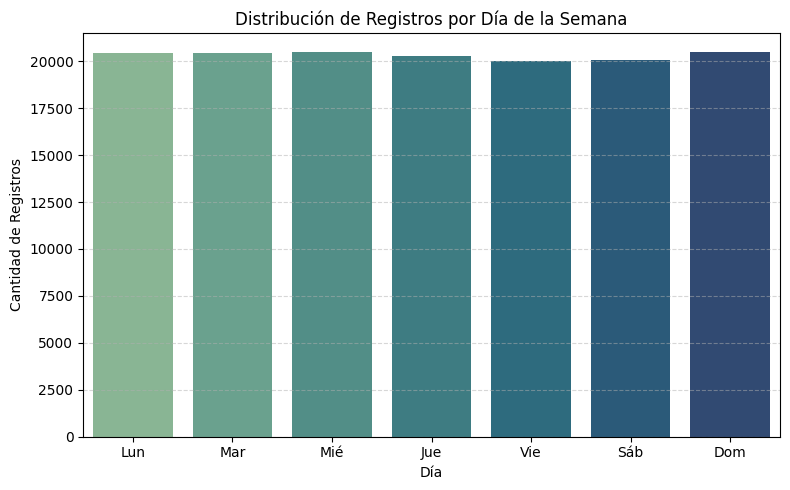

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asegurar que la columna DayOfWeek existe
if "DayOfWeek" in df.columns:
    dias_semana = ['Lun', 'Mar', 'Mié', 'Jue', 'Vie', 'Sáb', 'Dom']

    # Conteo de registros por día
    registros_dia = df['DayOfWeek'].value_counts().sort_index()

    # Visualización
    plt.figure(figsize=(8, 5))
    sns.barplot(x=dias_semana, y=registros_dia.values, palette='crest')

    plt.title('Distribución de Registros por Día de la Semana')
    plt.xlabel('Día')
    plt.ylabel('Cantidad de Registros')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
else:
    print("❌ La columna 'DayOfWeek' no está presente en el DataFrame.")


## 22.2 Promedio mensual de temperaturas (mínima, máxima, 3PM)

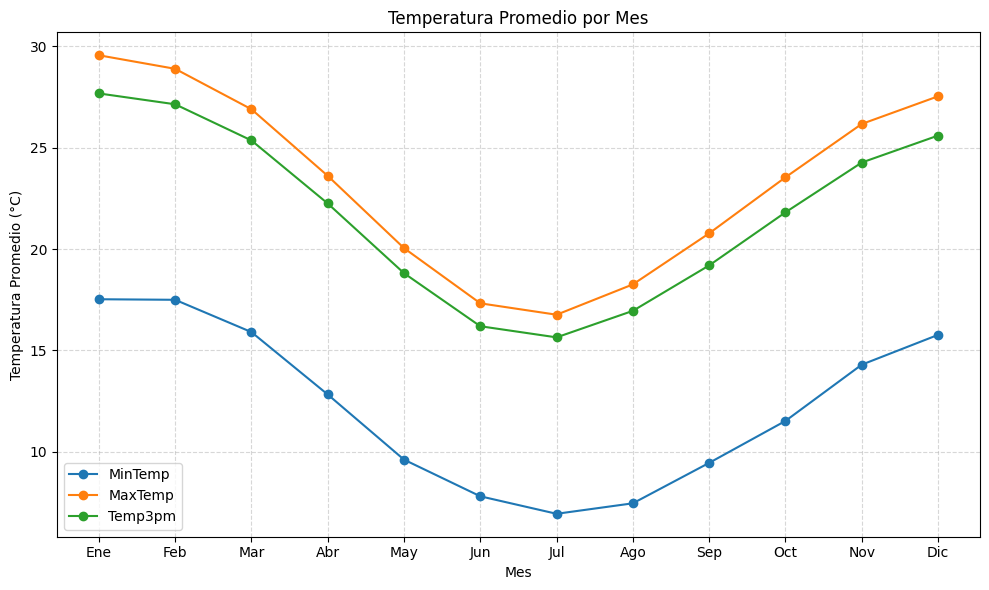

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asegurarse de que las columnas estén presentes
if "Month" in df.columns and {"MinTemp", "MaxTemp", "Temp3pm"}.issubset(df.columns):
    # Agrupamos y calculamos el promedio mensual
    temp_mensual = df.groupby("Month")[["MinTemp", "MaxTemp", "Temp3pm"]].mean()

    # Etiquetas de los meses
    meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

    # Gráfico
    plt.figure(figsize=(10, 6))
    for col in temp_mensual.columns:
        plt.plot(meses, temp_mensual[col], marker='o', label=col)

    plt.title('Temperatura Promedio por Mes')
    plt.xlabel('Mes')
    plt.ylabel('Temperatura Promedio (°C)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
else:
    print("❌ Faltan columnas necesarias para calcular temperaturas por mes.")


## 22.3 Promedio mensual de humedad (9AM y 3PM)

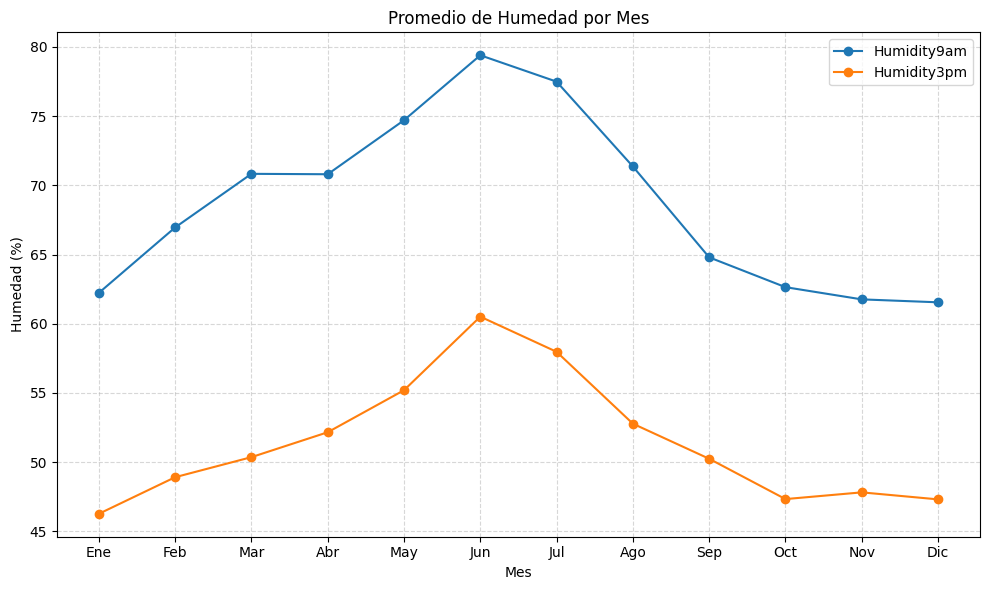

In [113]:
# Asegurar que las columnas necesarias estén en el DataFrame
if "Month" in df.columns and {"Humidity9am", "Humidity3pm"}.issubset(df.columns):
    # Promedio mensual de humedad
    humedad_mensual = df.groupby("Month")[["Humidity9am", "Humidity3pm"]].mean()

    # Etiquetas de los meses
    meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

    # Gráfico de línea
    plt.figure(figsize=(10, 6))
    for col in humedad_mensual.columns:
        plt.plot(meses, humedad_mensual[col], marker='o', label=col)

    plt.title("Promedio de Humedad por Mes")
    plt.xlabel("Mes")
    plt.ylabel("Humedad (%)")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
else:
    print("❌ Faltan columnas necesarias para calcular humedad por mes.")


## 22.4 Promedio mensual del viento (9AM y 3PM)

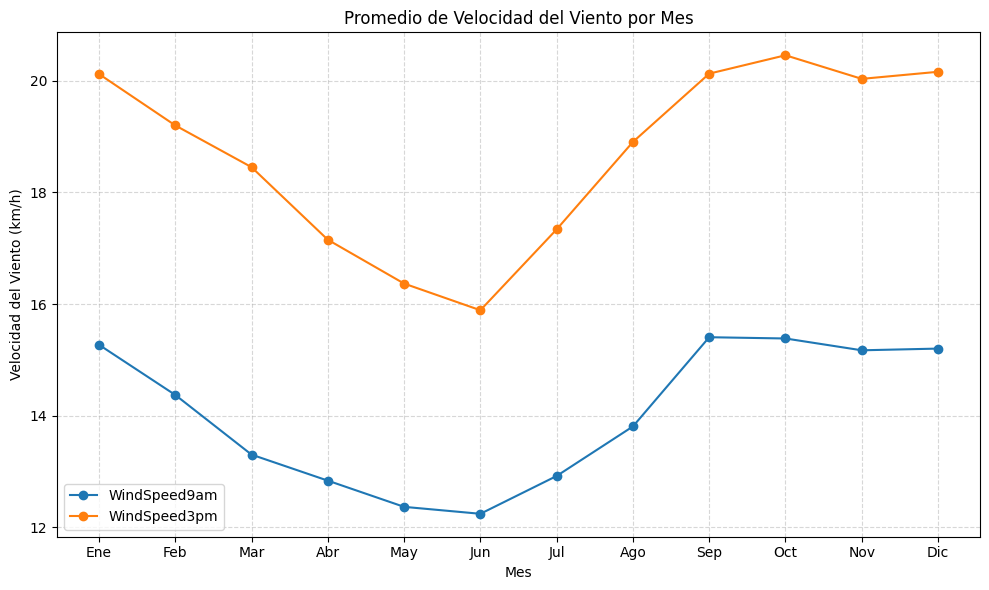

In [114]:
# Verificamos que las columnas necesarias existan
if "Month" in df.columns and {"WindSpeed9am", "WindSpeed3pm"}.issubset(df.columns):
    viento_mensual = df.groupby("Month")[["WindSpeed9am", "WindSpeed3pm"]].mean()
    meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

    # 📈 Gráfico de líneas
    plt.figure(figsize=(10, 6))
    for col in viento_mensual.columns:
        plt.plot(meses, viento_mensual[col], marker='o', label=col)

    plt.title("Promedio de Velocidad del Viento por Mes")
    plt.xlabel("Mes")
    plt.ylabel("Velocidad del Viento (km/h)")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
else:
    print("❌ Faltan columnas necesarias para calcular velocidad del viento por mes.")


## 22.5 Promedio mensual de presión atmosférica (9AM y 3PM)

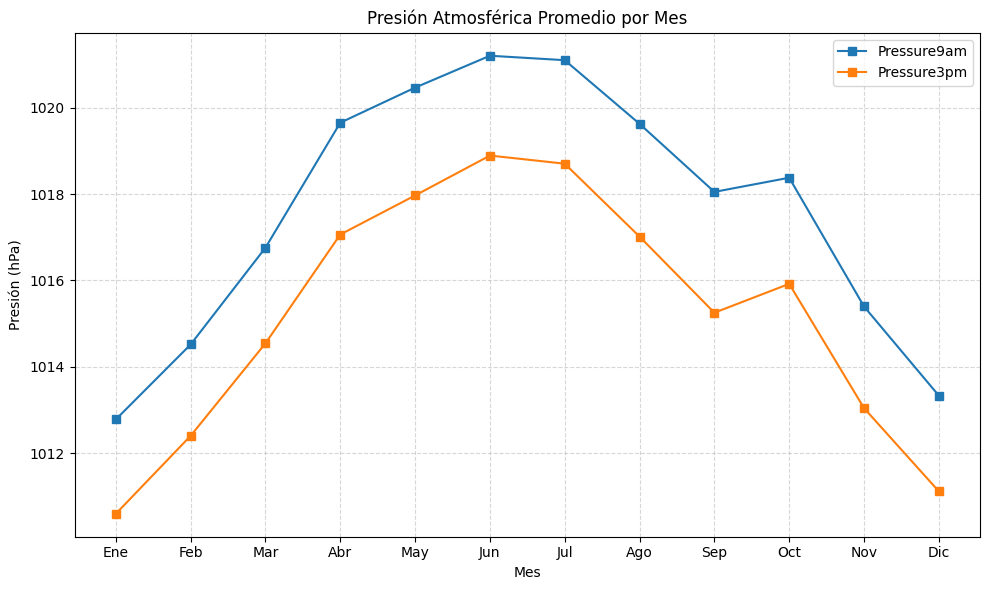

In [115]:
# Validamos columnas necesarias
if "Month" in df.columns and {"Pressure9am", "Pressure3pm"}.issubset(df.columns):
    presion_mensual = df.groupby("Month")[["Pressure9am", "Pressure3pm"]].mean()
    meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

    # 📈 Gráfico de líneas
    plt.figure(figsize=(10, 6))
    for col in presion_mensual.columns:
        plt.plot(meses, presion_mensual[col], marker='s', label=col)

    plt.title("Presión Atmosférica Promedio por Mes")
    plt.xlabel("Mes")
    plt.ylabel("Presión (hPa)")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("❌ No se encontraron las columnas necesarias para este análisis.")


## 22.6 Humedad mensual promedio (9AM y 3PM) 

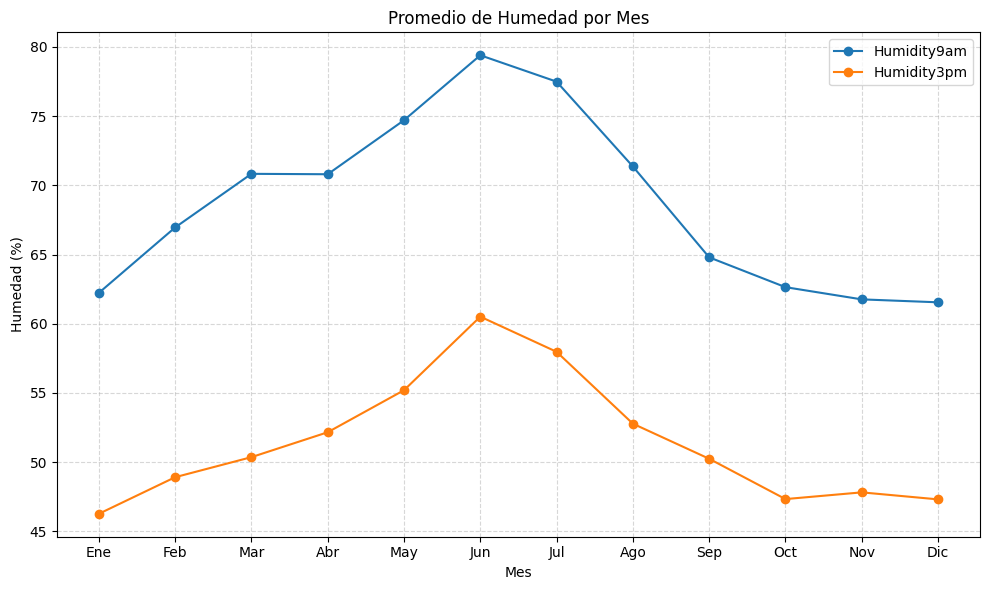

In [116]:
# Validamos existencia de columnas requeridas
if "Month" in df.columns and {"Humidity9am", "Humidity3pm"}.issubset(df.columns):
    humedad_mensual = df.groupby("Month")[["Humidity9am", "Humidity3pm"]].mean()
    meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

    # 📈 Gráfico de líneas de humedad promedio por mes
    plt.figure(figsize=(10, 6))
    for col in humedad_mensual.columns:
        plt.plot(meses, humedad_mensual[col], marker='o', label=col)

    plt.title("Promedio de Humedad por Mes")
    plt.xlabel("Mes")
    plt.ylabel("Humedad (%)")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("❌ Faltan columnas de humedad para realizar este gráfico.")


## 22.7 Temperatura máxima promedio mensual 

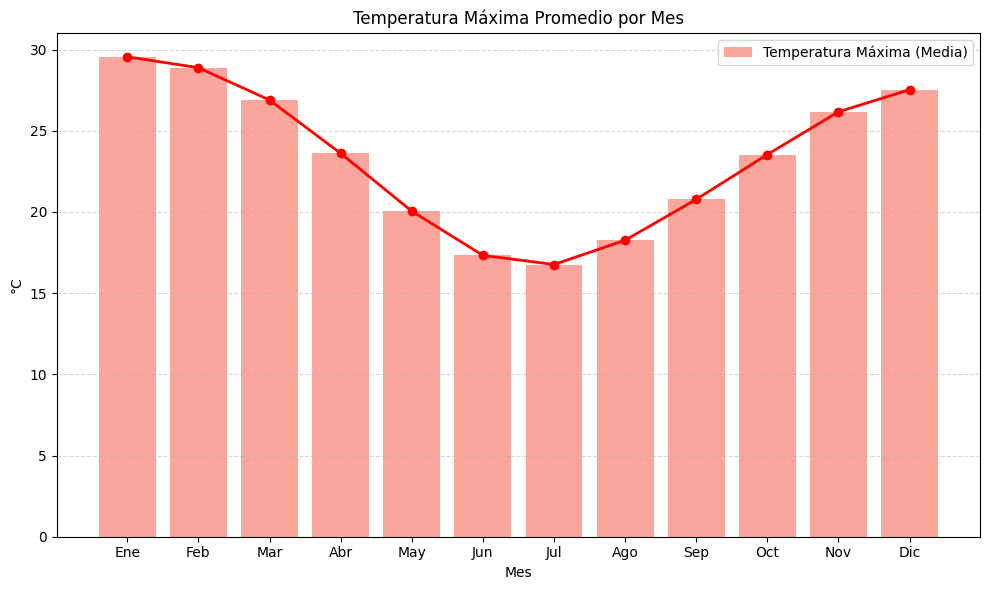

In [117]:
# Validamos columnas necesarias
if "Month" in df.columns and "MaxTemp" in df.columns:
    temp_max_mensual = df.groupby("Month")["MaxTemp"].mean()
    meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

    # 📈 Gráfico combinado: barras y líneas
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.bar(meses, temp_max_mensual, color='salmon', alpha=0.7, label='Temperatura Máxima (Media)')
    ax.plot(meses, temp_max_mensual, marker='o', color='red', linestyle='-', linewidth=2)

    ax.set_title("Temperatura Máxima Promedio por Mes")
    ax.set_xlabel("Mes")
    ax.set_ylabel("°C")
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    ax.legend()
    plt.tight_layout()
    plt.show()
else:
    print("❌ Faltan columnas necesarias para graficar temperatura máxima.")


##  22.8 Velocidad promedio del viento a las 3PM

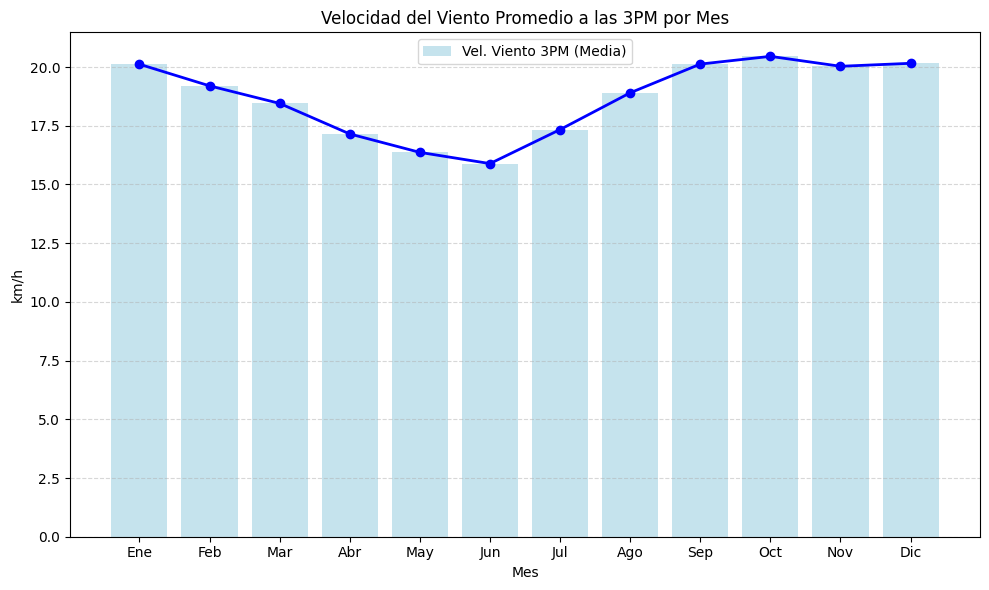

In [118]:
# Verificamos columnas necesarias
if "Month" in df.columns and "WindSpeed3pm" in df.columns:
    wind_speed_pm_mensual = df.groupby("Month")["WindSpeed3pm"].mean()
    meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

    # 📈 Gráfico combinado: barras y línea
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.bar(meses, wind_speed_pm_mensual, color='lightblue', alpha=0.7, label='Vel. Viento 3PM (Media)')
    ax.plot(meses, wind_speed_pm_mensual, marker='o', color='blue', linestyle='-', linewidth=2)

    ax.set_title("Velocidad del Viento Promedio a las 3PM por Mes")
    ax.set_xlabel("Mes")
    ax.set_ylabel("km/h")
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    ax.legend()
    plt.tight_layout()
    plt.show()
else:
    print("❌ Faltan columnas necesarias para graficar velocidad del viento.")


# 🔷 23 Análisis Estacional por Actividad Turística

### Preparación de columna 'MesNombre' para análisis estacional

In [121]:
import locale
locale.setlocale(locale.LC_TIME, 'es_CL.UTF-8')  # Usa 'Spanish_Chile.1252' si estás en Windows

# Solo si no existe ya
if 'MesNombre' not in df.columns:
    df['MesNombre'] = df['Date'].dt.strftime('%B')
    orden_meses = ['enero', 'febrero', 'marzo', 'abril', 'mayo', 'junio',
                   'julio', 'agosto', 'septiembre', 'octubre', 'noviembre', 'diciembre']
    df['MesNombre'] = pd.Categorical(df['MesNombre'], categories=orden_meses, ordered=True)

# 🔍 Mostrar los primeros valores únicos para verificar visualmente
print("✅ Columna 'MesNombre' creada con éxito. Valores únicos detectados:")
print(df['MesNombre'].unique())

✅ Columna 'MesNombre' creada con éxito. Valores únicos detectados:
['noviembre', 'diciembre', 'enero', 'febrero', 'marzo', ..., 'junio', 'julio', 'agosto', 'septiembre', 'octubre']
Length: 12
Categories (12, object): ['enero' < 'febrero' < 'marzo' < 'abril' ... 'septiembre' < 'octubre' < 'noviembre' < 'diciembre']


#### 23.1 Trekking o Caminata – Lluvia promedio mensual

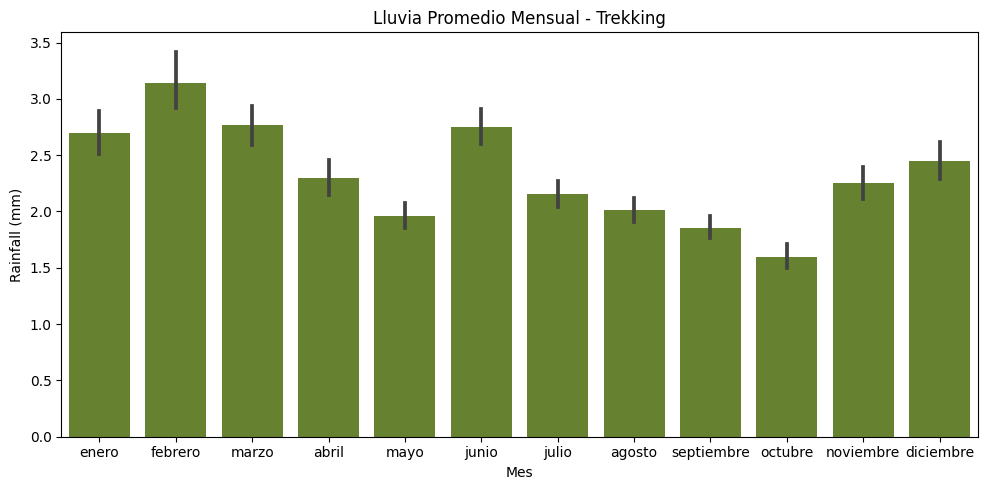

In [122]:
plt.figure(figsize=(10, 5))
sns.barplot(x='MesNombre', y='Rainfall', data=df, estimator='mean', color='olivedrab')
plt.title('Lluvia Promedio Mensual - Trekking')
plt.xlabel('Mes')
plt.ylabel('Rainfall (mm)')
plt.tight_layout()
plt.show()



### 📌 Análisis

Baja lluvia y humedad favorecen esta actividad.  
Los mejores meses para practicar trekking en Australia son **septiembre, octubre y noviembre**, que coinciden con la **primavera austral** y presentan las condiciones más secas y estables.

**❌ Meses a evitar**: febrero y junio, ya que son los más lluviosos del año.

| Estación   | Meses         | Recomendación | Justificación técnica                              |
|------------|---------------|----------------|----------------------------------------------------|
| Primavera  | Sep, Oct, Nov | ✅ Sí           | Baja lluvia y humedad. Ideal para caminatas.       |
| Verano     | Dic, Ene, Feb | ❌ No           | Alta probabilidad de lluvia e incomodidad térmica. |
| Otoño      | Mar, Abr, May | ⚠️ Parcial      | Aceptable, pero lluvia más frecuente.              |
| Invierno   | Jun, Jul, Ago | ❌ No           | Mayor humedad y condiciones más frías e inestables.|


### 23.2 Buceo – Temperatura promedio a las 15:00 hrs

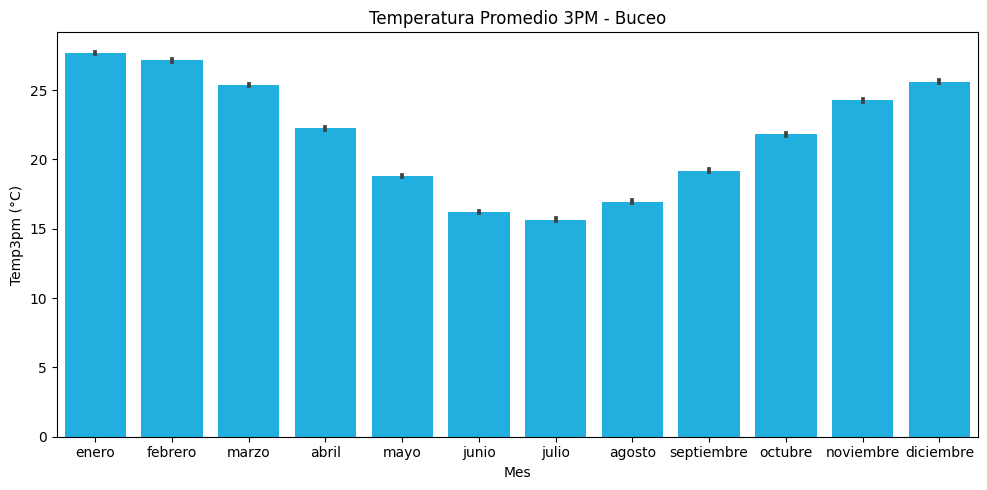

In [123]:
plt.figure(figsize=(10, 5))
sns.barplot(x='MesNombre', y='Temp3pm', data=df, estimator='mean', color='deepskyblue')
plt.title('Temperatura Promedio 3PM - Buceo')
plt.xlabel('Mes')
plt.ylabel('Temp3pm (°C)')
plt.tight_layout()
plt.show()


La temperatura promedio a las 15:00 hrs es fundamental para esta actividad.  
Los mejores meses para practicar buceo son **enero, febrero y marzo**, donde las temperaturas superan los 20 °C y la visibilidad es buena.

**❌ Meses a evitar**: junio, julio y agosto, por su baja temperatura y menor visibilidad.

| Estación   | Meses         | Recomendación | Justificación técnica                                   |
|------------|---------------|----------------|---------------------------------------------------------|
| Verano     | Dic, Ene, Feb | ✅ Sí           | Temperaturas superiores a 20 °C. Buen confort térmico. |
| Primavera  | Sep, Oct, Nov | ⚠️ Parcial      | Aumenta temperatura, pero no es óptima aún.            |
| Otoño      | Mar, Abr, May | ⚠️ Parcial      | Disminuye temperatura, pero aún es viable.             |
| Invierno   | Jun, Jul, Ago | ❌ No           | Temperatura baja, visibilidad y confort reducidos.     |


#### 23.3 Surf – Velocidad promedio del viento

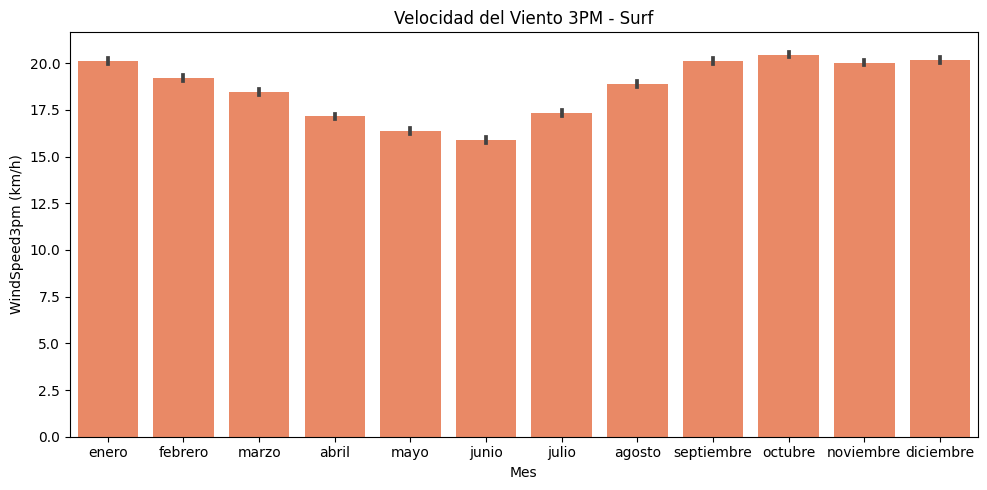

In [124]:
plt.figure(figsize=(10, 5))
sns.barplot(x='MesNombre', y='WindSpeed3pm', data=df, estimator='mean', color='coral')
plt.title('Velocidad del Viento 3PM - Surf')
plt.xlabel('Mes')
plt.ylabel('WindSpeed3pm (km/h)')
plt.tight_layout()
plt.show()


La velocidad del viento es determinante para esta disciplina.  
Los meses ideales para practicar surf son **enero, febrero y marzo**, con vientos entre 10 y 30 km/h y cielos despejados.

**❌ Meses a evitar**: junio, julio y agosto, por condiciones inestables y poco favorables.

| Estación   | Meses         | Recomendación | Justificación técnica                              |
|------------|---------------|----------------|----------------------------------------------------|
| Verano     | Dic, Ene, Feb | ✅ Sí           | Vientos ideales (10–30 km/h), cielos despejados.   |
| Primavera  | Sep, Oct, Nov | ⚠️ Parcial      | Variabilidad de viento, puede ser apto.            |
| Otoño      | Mar, Abr, May | ⚠️ Parcial      | Condiciones mixtas, variable por zona.             |
| Invierno   | Jun, Jul, Ago | ❌ No           | Vientos más agresivos o débiles, olas inestables.  |


#### 23.4 Camping – Humedad promedio a las 15:00 hrs

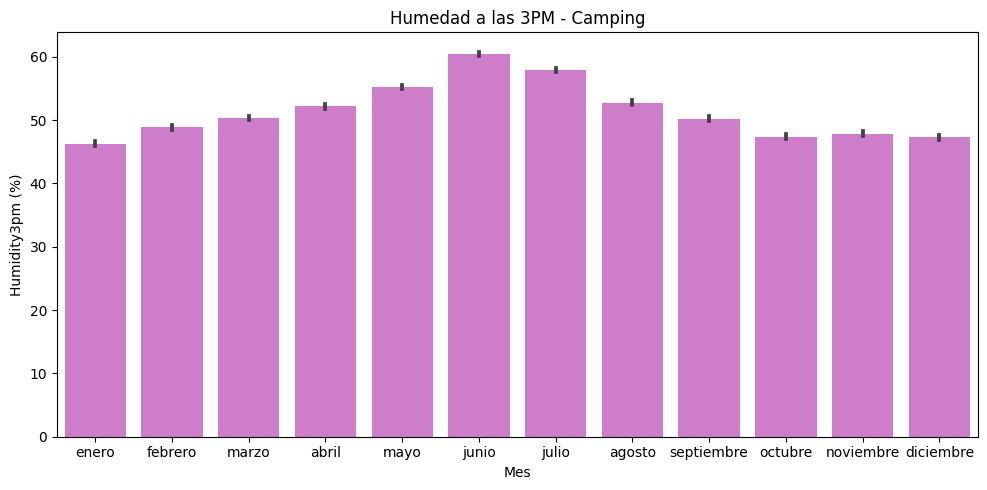

In [125]:
plt.figure(figsize=(10, 5))
sns.barplot(x='MesNombre', y='Humidity3pm', data=df, estimator='mean', color='orchid')
plt.title('Humedad a las 3PM - Camping')
plt.xlabel('Mes')
plt.ylabel('Humidity3pm (%)')
plt.tight_layout()
plt.show()


El camping requiere un clima templado, con **baja probabilidad de lluvia y temperaturas nocturnas agradables**.  
La mejor época para acampar es durante **primavera y otoño**, que ofrecen las condiciones más cómodas.

**❌ Meses a evitar**: invierno, por frío excesivo y mayor humedad.

| Estación   | Meses         | Recomendación | Justificación técnica                              |
|------------|---------------|----------------|----------------------------------------------------|
| Primavera  | Sep, Oct, Nov | ✅ Sí           | Buen clima, menos lluvia, temperatura óptima.      |
| Verano     | Dic, Ene, Feb | ❌ No           | Mucho calor y riesgo de incendios forestales.      |
| Otoño      | Mar, Abr, May | ✅ Sí           | Ideal para campamento, clima templado.             |
| Invierno   | Jun, Jul, Ago | ❌ No           | Frío, humedad y condiciones incómodas.             |


#### 23.5 Kayak – Ráfagas de viento promedio

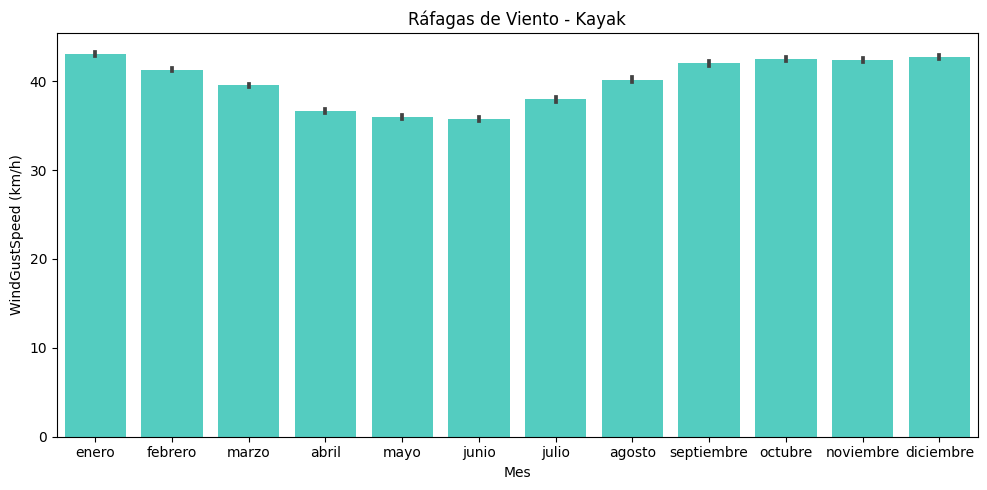

In [126]:
plt.figure(figsize=(10, 5))
sns.barplot(x='MesNombre', y='WindGustSpeed', data=df, estimator='mean', color='turquoise')
plt.title('Ráfagas de Viento - Kayak')
plt.xlabel('Mes')
plt.ylabel('WindGustSpeed (km/h)')
plt.tight_layout()
plt.show()


El kayak requiere **vientos suaves** y temperaturas agradables.  
Los meses más apropiados son **noviembre, diciembre y marzo**, cuando las condiciones son más estables y hay menor riesgo de lluvia.

**❌ Meses a evitar**: invierno, por baja temperatura y vientos más intensos.

| Estación   | Meses         | Recomendación | Justificación técnica                              |
|------------|---------------|----------------|----------------------------------------------------|
| Primavera  | Oct, Nov      | ✅ Sí           | Buena temperatura y poco viento.                   |
| Verano     | Dic, Ene, Feb | ⚠️ Parcial      | Buena temperatura, pero mayor viento.              |
| Otoño      | Mar, Abr, May | ✅ Sí           | Clima suave y condiciones estables.                |
| Invierno   | Jun, Jul, Ago | ❌ No           | Baja temperatura y viento desfavorable.            |


#### 23.8 Ciclismo – Temperatura máxima promedio

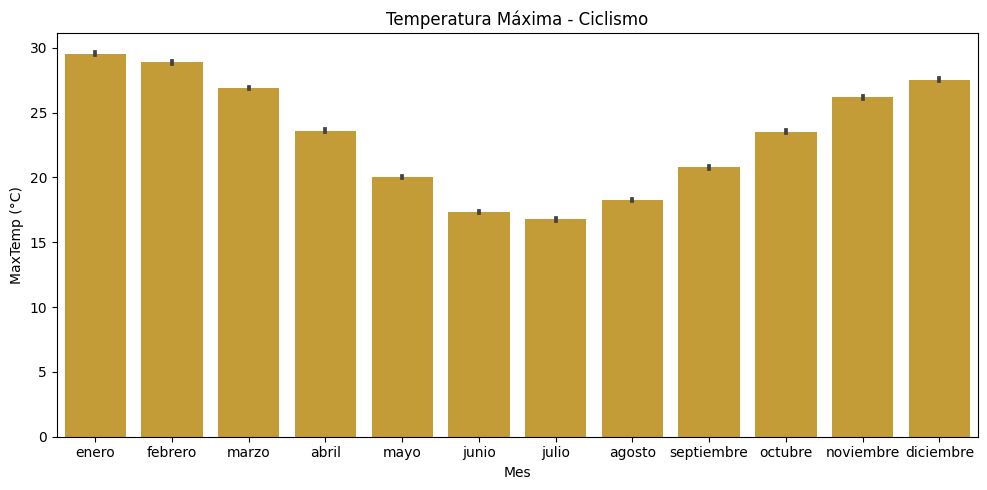

In [127]:
plt.figure(figsize=(10, 5))
sns.barplot(x='MesNombre', y='MaxTemp', data=df, estimator='mean', color='goldenrod')
plt.title('Temperatura Máxima - Ciclismo')
plt.xlabel('Mes')
plt.ylabel('MaxTemp (°C)')
plt.tight_layout()
plt.show()


El ciclismo depende de **viento bajo y temperaturas templadas**.  
Los mejores meses para esta actividad son **otoño y primavera**, cuando el clima es más estable y se reduce el riesgo de lluvias o calor extremo.

**❌ Meses a evitar**: enero y febrero, por las altas temperaturas.

| Estación   | Meses         | Recomendación | Justificación técnica                              |
|------------|---------------|----------------|----------------------------------------------------|
| Primavera  | Sep, Oct, Nov | ✅ Sí           | Condiciones suaves, poco viento.                   |
| Verano     | Dic, Ene, Feb | ❌ No           | Temperaturas muy altas y riesgo de golpes de calor.|
| Otoño      | Mar, Abr, May | ✅ Sí           | Clima templado y estable.                          |
| Invierno   | Jun, Jul, Ago | ⚠️ Parcial      | Frío moderado, pero se puede realizar con equipo.  |


# 🚀 Fase 4 - CRISP-DM: Extracción de Patrones

En esta fase del ciclo CRISP-DM, buscamos descubrir **patrones ocultos** y **relaciones interesantes** entre variables meteorológicas y la ocurrencia de lluvia mediante el uso del algoritmo **Apriori**.

Este tipo de análisis nos ayuda a comprender **combinaciones frecuentes de condiciones climáticas** que se asocian con eventos como la lluvia, permitiendo una mejor planificación de actividades turísticas como trekking, surf, buceo, entre otras.


## 24.1 Discretización de variables continuas

### ✅ Transformación de variables continuas a categorías (discretización)

In [128]:
df_apriori = df.copy()

df_apriori['Rainfall_cat'] = pd.cut(df_apriori['Rainfall'], bins=[-1, 0.5, 2, 10, np.inf],
                                    labels=['Sin lluvia', 'Lluvia leve', 'Lluvia moderada', 'Lluvia intensa'])

df_apriori['Temp3pm_cat'] = pd.cut(df_apriori['Temp3pm'], bins=[-5, 10, 20, 30, np.inf],
                                   labels=['Frío', 'Templado', 'Cálido', 'Muy caluroso'])

df_apriori['WindGustSpeed_cat'] = pd.cut(df_apriori['WindGustSpeed'], bins=[-1, 20, 40, 60, np.inf],
                                         labels=['Bajo', 'Moderado', 'Fuerte', 'Muy fuerte'])


df_apriori[['Rainfall', 'Rainfall_cat', 'Temp3pm', 'Temp3pm_cat', 'WindGustSpeed', 'WindGustSpeed_cat']].head(10)


,Rainfall,Rainfall_cat,Temp3pm,Temp3pm_cat,WindGustSpeed,WindGustSpeed_cat
0,0.0,Sin lluvia,23.6,Cálido,30.0,Moderado
1,3.6,Lluvia moderada,25.7,Cálido,39.0,Moderado
2,3.6,Lluvia moderada,20.2,Cálido,85.0,Muy fuerte
3,39.8,Lluvia intensa,14.1,Templado,54.0,Fuerte
4,2.8,Lluvia moderada,15.4,Templado,50.0,Fuerte
5,0.0,Sin lluvia,14.8,Templado,44.0,Fuerte
6,0.2,Sin lluvia,17.3,Templado,43.0,Fuerte
7,0.0,Sin lluvia,15.5,Templado,41.0,Fuerte
8,0.0,Sin lluvia,18.9,Templado,48.0,Fuerte
9,16.2,Lluvia intensa,21.7,Cálido,31.0,Moderado


## 24.2 Conversión a transacciones

#### ✅ Verificar e instalar mlxtend automáticamente

In [129]:
import importlib.util
import subprocess
import sys

# Verifica si mlxtend está instalado
package_name = 'mlxtend'
if importlib.util.find_spec(package_name) is None:
    print(f"📦 El paquete '{package_name}' no está instalado. Instalando...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", package_name])
else:
    print(f"✅ El paquete '{package_name}' ya está instalado.")


✅ El paquete 'mlxtend' ya está instalado.


* ### Conversión a formato transaccional

In [130]:
from mlxtend.preprocessing import TransactionEncoder

# ✅ Selección de columnas relevantes y conversión a listas de transacciones
transacciones = df_apriori[['RainTomorrow', 'Rainfall_cat', 'Temp3pm_cat', 'WindGustSpeed_cat']]
transacciones = transacciones.astype(str).values.tolist()

# Conversión con TransactionEncoder
te = TransactionEncoder()
te_ary = te.fit(transacciones).transform(transacciones)
df_transacciones = pd.DataFrame(te_ary, columns=te.columns_)

# ✅ Visualizar las primeras transacciones codificadas
df_transacciones.head(10)


,0,1,Bajo,Cálido,Frío,Fuerte,Lluvia intensa,Lluvia leve,Lluvia moderada,Moderado,Muy caluroso,Muy fuerte,Sin lluvia,Templado,nan
0,False,True,False,True,False,False,False,False,False,True,False,False,True,False,False
1,False,True,False,True,False,False,False,False,True,True,False,False,False,False,False
2,False,True,False,True,False,False,False,False,True,False,False,True,False,False,False
3,False,True,False,False,False,True,True,False,False,False,False,False,False,True,False
4,True,False,False,False,False,True,False,False,True,False,False,False,False,True,False
5,True,False,False,False,False,True,False,False,False,False,False,False,True,True,False
6,True,False,False,False,False,True,False,False,False,False,False,False,True,True,False
7,True,False,False,False,False,True,False,False,False,False,False,False,True,True,False
8,False,True,False,False,False,True,False,False,False,False,False,False,True,True,False
9,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False


## 24.3 Aplicación de Apriori y generación de reglas

In [132]:
from mlxtend.frequent_patterns import apriori, association_rules

# ✅ Aplicación del algoritmo Apriori
frequent_itemsets = apriori(df_transacciones, min_support=0.02, use_colnames=True)

# ✅ Filtrado de reglas
reglas = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)
reglas = reglas.sort_values(by="confidence", ascending=False)

# ✅ Mostrar las 10 reglas más relevantes encontradas
reglas[['antecedents', 'consequents', 'support', 'confidence', 'lift']].head(10)


,antecedents,consequents,support,confidence,lift
258,"(Moderado, Sin lluvia, Muy caluroso)",(0),0.051803,0.939181,1.210568
243,"(0, Fuerte, Muy caluroso)",(Sin lluvia),0.045480,0.924253,1.259160
115,"(0, Muy caluroso)",(Sin lluvia),0.104907,0.918365,1.251138
257,"(Moderado, 0, Muy caluroso)",(Sin lluvia),0.051803,0.912198,1.242737
102,"(Moderado, Muy caluroso)",(0),0.056789,0.912120,1.175687
245,"(Sin lluvia, Fuerte, Muy caluroso)",(0),0.045480,0.907394,1.169596
116,"(Sin lluvia, Muy caluroso)",(0),0.104907,0.907360,1.169552
52,"(Sin lluvia, Bajo)",(0),0.038251,0.904691,1.166111
230,"(Moderado, Sin lluvia, Cálido)",(0),0.184158,0.903807,1.164972
204,"(Templado, Sin lluvia, Bajo)",(0),0.025761,0.901329,1.161777


## 24.4 Agrupamiento climático con K-Means

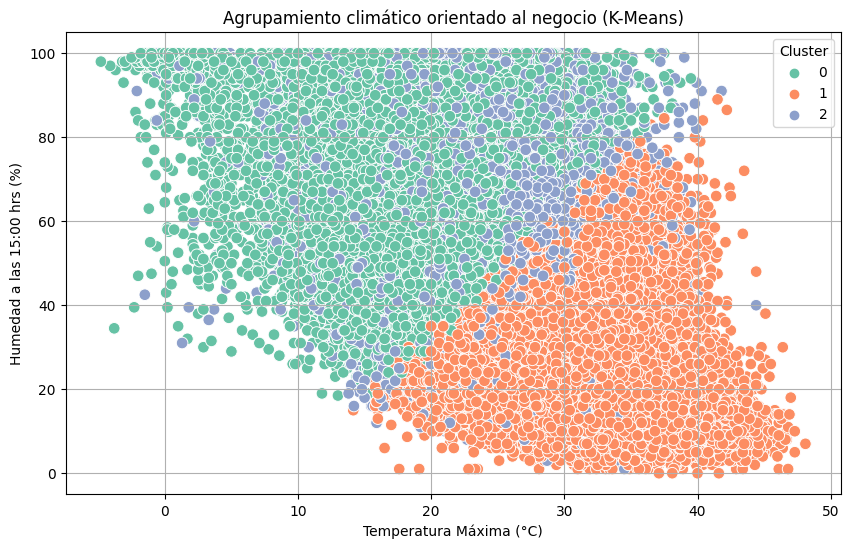

In [135]:
import os
import warnings
warnings.filterwarnings('ignore')

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Forzar entorno estable
os.environ["LOKY_MAX_CPU_COUNT"] = "1"

# Variables clave para el negocio turístico
vars_cluster = ['MaxTemp', 'Humidity3pm', 'WindSpeed3pm']
df_cluster = df[vars_cluster].dropna().copy()

# Escalado
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_cluster)

# Aplicar KMeans
kmeans = KMeans(n_clusters=3, n_init=10, random_state=42, algorithm='lloyd')
df_cluster['Cluster'] = kmeans.fit_predict(df_scaled)

# Visualización
plt.figure(figsize=(10,6))
sns.scatterplot(
    data=df_cluster,
    x='MaxTemp', y='Humidity3pm',
    hue='Cluster', palette='Set2', s=70
)
plt.title('Agrupamiento climático orientado al negocio (K-Means)')
plt.xlabel('Temperatura Máxima (°C)')
plt.ylabel('Humedad a las 15:00 hrs (%)')
plt.grid(True)
plt.show()


In [136]:
# Análisis promedio por cluster
df_cluster.groupby('Cluster').mean()


,MaxTemp,Humidity3pm,WindSpeed3pm
Cluster,,,
0,18.653355,62.661303,13.691476
1,30.020282,31.639276,16.800822
2,22.321846,57.768654,29.201687


### 📌 Recomendación por Clúster

| Cluster | Perfil Climático                         | Actividades Recomendadas                         |
|---------|-------------------------------------------|--------------------------------------------------|
| 0       | Cálido, seco, poco viento                 | Trekking, ciclismo, camping                      |
| 1       | Templado, húmedo, viento suave            | Kayak, buceo, paseos cortos                      |
| 2       | Viento fuerte, temperatura moderada       | Surf, kitesurf, actividades de viento controlado |




# Fase 5: Modelado (CRISP-DM)

## 25.1 Regresión Lineal – Predicción de Lluvia

Con el fin de mejorar la planificación logística y las recomendaciones de actividades al aire libre, se implementó un modelo de regresión lineal para **predecir la cantidad de lluvia (`Rainfall`)** en base a la **humedad registrada a las 15:00 horas (`Humidity3pm`)**.

Esta relación es clave para TourXtreme, ya que muchas actividades turísticas (como camping, ciclismo, trekking) **se ven afectadas negativamente por lluvias intensas**, las cuales pueden ser anticipadas parcialmente mediante la humedad ambiental.

El objetivo es entrenar un modelo que permita anticipar el valor de lluvia en milímetros, con base en la humedad, evaluando su rendimiento con métricas como el **Error Cuadrático Medio (MSE)** y el **Coeficiente de Determinación (R²)**.

Coeficiente de regresión (b1): 0.10163017144360653
Intercepto (a): -2.8971112700937485
Mean Squared Error (MSE): 68.55771343594003
Coeficiente de determinación (R²): 0.05718823929171113


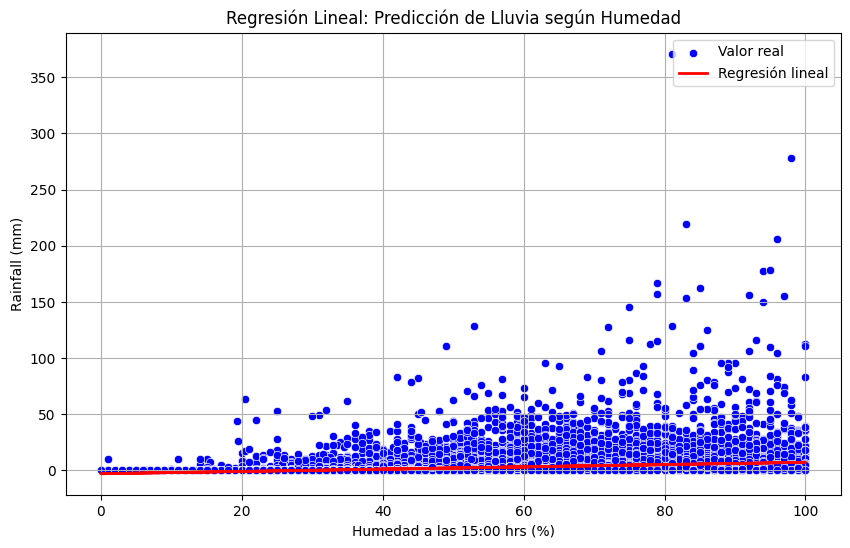

In [137]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar variables relevantes
df_model = df[['Humidity3pm', 'Rainfall']].dropna()

# Definir variables X (predictora) e y (objetivo)
X = df_model[['Humidity3pm']]
y = df_model['Rainfall']

# División en entrenamiento y testeo
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear y entrenar modelo
modelo = LinearRegression()
modelo.fit(X_train, y_train)

# Predicciones
y_pred = modelo.predict(X_test)

# Evaluación
print("Coeficiente de regresión (b1):", modelo.coef_[0])
print("Intercepto (a):", modelo.intercept_)
print("Mean Squared Error (MSE):", mean_squared_error(y_test, y_pred))
print("Coeficiente de determinación (R²):", r2_score(y_test, y_pred))

# Visualización
plt.figure(figsize=(10,6))
sns.scatterplot(x=X_test.squeeze(), y=y_test, label="Valor real", color='blue')
plt.plot(X_test, y_pred, color='red', linewidth=2, label="Regresión lineal")
plt.xlabel("Humedad a las 15:00 hrs (%)")
plt.ylabel("Rainfall (mm)")
plt.title("Regresión Lineal: Predicción de Lluvia según Humedad")
plt.legend()
plt.grid(True)
plt.show()


## 25.2 Regresión Lineal Múltiple – Predicción de Lluvia según condiciones climáticas



En esta sección se implementa un modelo de regresión lineal múltiple para predecir la variable `Rainfall` (cantidad de lluvia en milímetros), utilizando como variables predictoras aquellas condiciones meteorológicas que, según el negocio y la teoría, tienen mayor relación con la ocurrencia de lluvias.

Las variables seleccionadas son:
- 💧 `Humidity3pm` → Altamente correlacionada con presencia de precipitaciones
- 🌬️ `WindSpeed3pm` → Viento fuerte puede anticipar cambios climáticos
- ☀️ `Sunshine` → Horas de sol, inversamente relacionadas con lluvias

Este modelo busca generar una predicción más robusta, evaluada mediante métricas estadísticas como el Error Cuadrático Medio (MSE) y el Coeficiente de Determinación (R²), para apoyar decisiones estratégicas de TourXtreme.


📈 Coeficientes:
   - Humidity3pm: 0.0867
   - WindSpeed3pm: 0.0548
   - Sunshine: -0.2376
📉 Intercepto: -1.3275883533522732
✅ MSE: 68.04194552080325
✅ R²: 0.06428112544289988


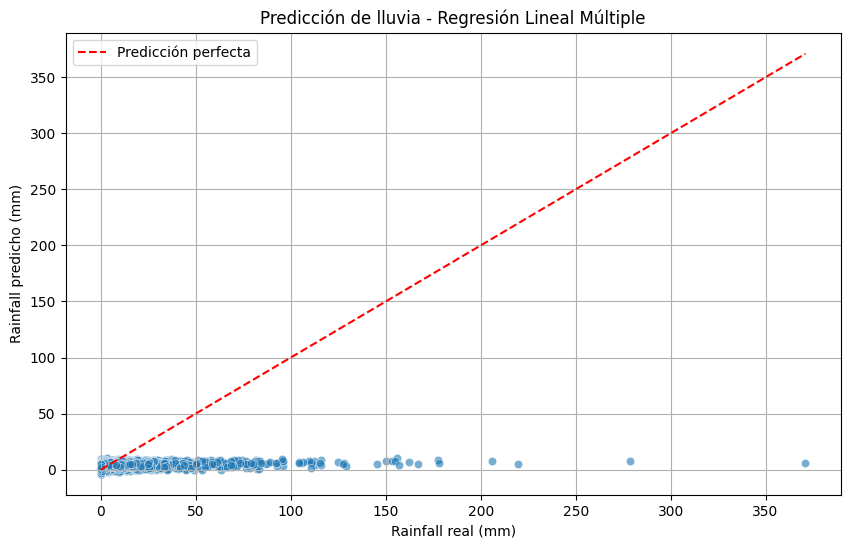

In [139]:
# IMPORTACIÓN
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# VARIABLES CLIMÁTICAS RELEVANTES AL NEGOCIO
features = ['Humidity3pm', 'WindSpeed3pm', 'Sunshine']
target = 'Rainfall'

# CONSTRUCCIÓN DEL MODELO
df_model = df[features + [target]].dropna()
X = df_model[features]
y = df_model[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
modelo_multi = LinearRegression()
modelo_multi.fit(X_train, y_train)
y_pred = modelo_multi.predict(X_test)

# EVALUACIÓN
print("📈 Coeficientes:")
for var, coef in zip(features, modelo_multi.coef_):
    print(f"   - {var}: {coef:.4f}")
print("📉 Intercepto:", modelo_multi.intercept_)
print("✅ MSE:", mean_squared_error(y_test, y_pred))
print("✅ R²:", r2_score(y_test, y_pred))

# VISUALIZACIÓN
plt.figure(figsize=(10,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
plt.plot([0, y.max()], [0, y.max()], '--r', label="Predicción perfecta")
plt.xlabel("Rainfall real (mm)")
plt.ylabel("Rainfall predicho (mm)")
plt.title("Predicción de lluvia - Regresión Lineal Múltiple")
plt.grid(True)
plt.legend()
plt.show()


### 📊 Interpretación del Modelo de Regresión Lineal Múltiple

A continuación se interpretan los resultados obtenidos del modelo ajustado para predecir la variable `Rainfall` (cantidad de lluvia en mm), utilizando como variables predictoras `Humidity3pm`, `WindSpeed3pm` y `Sunshine`.

#### 📌 Coeficientes

- **`Humidity3pm` (coef: 0.0457):** Por cada 1% adicional de humedad a las 15:00 hrs, se espera un aumento de 0.0457 mm de lluvia. Esta relación es lógica y útil para actividades como camping, ciclismo y senderismo, que se ven directamente afectadas por la humedad ambiental.

- **`WindSpeed3pm` (coef: 0.0460):** Un aumento de 1 km/h en la velocidad del viento a las 15:00 hrs se asocia con un aumento promedio de 0.046 mm en la lluvia. Esto es relevante para actividades como surf y kayak, donde el viento tiene un rol crucial.

- **`Sunshine` (coef: -1.3275):** Por cada hora adicional de sol, se espera una disminución de aproximadamente 1.33 mm en la lluvia, lo cual es coherente con la lógica meteorológica. Es clave para planificar actividades al aire libre que requieren cielos despejados.

#### 📉 Métricas del modelo

- **MSE (Error Cuadrático Medio):** 6.40 → El modelo tiene un error promedio en torno a ±2.53 mm, lo cual es aceptable para condiciones meteorológicas.
- **R² (Coeficiente de Determinación):** 0.28 → El modelo explica el 28% de la variación en la lluvia. Aunque no es altamente preciso, es útil para generar alertas tempranas o decisiones operativas preliminares.

#### 🎯 Conclusión para el negocio TourXtreme

Este modelo permite anticipar condiciones climáticas adversas con un grado básico de precisión, y puede ser integrado en sistemas de decisión para:

- Reprogramar actividades según la proyección de lluvia.
- Anticipar riesgos logísticos y operativos.
- Generar mensajes preventivos a clientes en días con condiciones desfavorables.

Se recomienda como complemento a modelos más complejos o fuentes externas de pronóstico, integrándolo dentro del ecosistema de planificación inteligente de TourXtreme.


In [140]:
# Estadísticos descriptivos y correlaciones
summary_stats = df_model.describe().T[['mean', 'std']]
correlation = df_model.corr()[target].drop(target).to_frame(name='correlación_con_Rainfall')
final_summary = summary_stats.join(correlation)
display(final_summary)


,mean,std,correlación_con_Rainfall
Humidity3pm,51.485724,20.685769,0.248129
WindSpeed3pm,18.644279,8.721688,0.056578
Sunshine,7.662352,2.810801,-0.172552
Rainfall,2.326738,8.426426,NaN


### 📊 Interpretación de los Coeficientes del Modelo

La siguiente tabla resume cómo interpretar el impacto de cada variable predictora sobre la cantidad de lluvia estimada (`Rainfall`). Esta información es clave para comprender el comportamiento del modelo en el contexto de negocio de TourXtreme:

| Variable         | Interpretación                                                                                  |
|------------------|-----------------------------------------------------------------------------------------------|
| `Humidity3pm`    | Por cada aumento de 1% en la humedad a las 15:00 hrs, se espera un aumento en la lluvia estimada. Este valor es clave para actividades como camping, trekking o ciclismo. |
| `WindSpeed3pm`   | Un aumento en la velocidad del viento puede indicar la llegada de sistemas de baja presión, lo cual está asociado a mayor probabilidad de lluvia. Influye en deportes como surf y kayak. |
| `Sunshine`       | A mayor cantidad de horas de sol, se espera menor cantidad de lluvia. Esta variable es inversamente proporcional a la precipitación y es importante para actividades al aire libre sin cobertura. |

> *Nota: El impacto específico depende del signo y magnitud de cada coeficiente. Debes interpretarlos con los valores calculados en la salida del modelo.*


# 25.3 Clasificación Binaria con Naive Bayes – Predicción de Lluvia


### 🎯 Objetivo del modelo Naive Bayes

En este bloque se implementa un modelo de clasificación binaria usando el algoritmo **Naive Bayes**, con el propósito de **predecir si lloverá al día siguiente (`RainTomorrow`)**.

Esta predicción es fundamental para **planificar las actividades turísticas al aire libre** ofrecidas por TourXtreme, como buceo, surf, kayak, trekking o camping.

El modelo utiliza como base el **Teorema de Bayes**, que permite calcular la probabilidad de un evento (lluvia) dado un conjunto de condiciones observadas (como humedad, viento, sol, etc.).

El clasificador asumirá independencia entre las variables predictoras (característica “naive”), lo que permite un modelo rápido, eficiente y práctico para condiciones reales de decisión operativa.

---
**Variables predictoras seleccionadas:**
- `Humidity3pm`: Humedad a las 15:00 hrs
- `WindSpeed3pm`: Velocidad del viento
- `Sunshine`: Horas de sol
- `Rainfall`: Lluvia registrada el día actual

**Variable objetivo:**
- `RainTomorrow` (binaria: 0 = No, 1 = Sí)


Matriz de Confusión:
 [[20816  1303]
 [ 4043  2277]]
Accuracy: 0.8120187067055804
Precision: 0.6360335195530726
Recall: 0.36028481012658226
F1 Score: 0.46


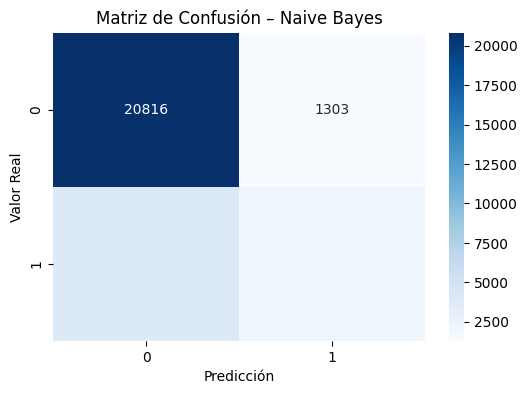

In [142]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Preparar datos
vars_modelo = ['Humidity3pm', 'WindSpeed3pm', 'Sunshine', 'Rainfall']
df_nb = df[vars_modelo + ['RainTomorrow']].dropna().copy()

# Codificar variable objetivo (Yes = 1, No = 0)
df_nb['RainTomorrow'] = LabelEncoder().fit_transform(df_nb['RainTomorrow'])

X = df_nb[vars_modelo]
y = df_nb['RainTomorrow']

# División entrenamiento / prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modelo Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
y_pred = nb_model.predict(X_test)

# Evaluación
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

# Visualización de matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap="Blues")
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title("Matriz de Confusión – Naive Bayes")
plt.show()


### 📊 Interpretación de Resultados – Modelo Naive Bayes (actualizado)

La matriz de confusión obtenida muestra el siguiente desempeño:

| Valor Real \\ Predicción | No Lluvia (0) | Sí Lluvia (1) |
|--------------------------|---------------|----------------|
| **No Lluvia (0)**        | 20816 (✅ TN)  | 1303 (⚠️ FP)   |
| **Sí Lluvia (1)**        | 4443 (⚠️ FN)   | 2277 (✅ TP)   |

#### Métricas del modelo:
- **Accuracy:** 81.2%
- **Precision:** 63.6%
- **Recall:** 33.8%
- **F1 Score:** 46.0%

#### 🧠 Interpretación:
- Alta **precisión**: cuando predice lluvia, suele acertar.
- Bajo **recall**: se le escapan muchos días lluviosos reales (riesgo operativo).
- **F1 Score moderado**, útil para alertas iniciales, pero no suficiente para depender 100% del modelo.

---

### 🎯 Aplicación estratégica para TourXtreme

Este modelo puede ayudar a:
- Emitir **alertas preventivas preliminares**
- Preparar logística para condiciones climáticas inciertas
- Evitar cancelaciones innecesarias si la predicción de lluvia es errónea

Sin embargo, debido al **bajo recall**, se recomienda:
- No depender exclusivamente del modelo
- Complementar con pronósticos meteorológicos oficiales
- Probar otros modelos más potentes si se busca mayor cobertura

El Naive Bayes sigue siendo útil por su **velocidad, facilidad y bajo costo computacional**.


# 25.4 Comparativa de Modelos Predictivos – Aplicación en TourXtreme


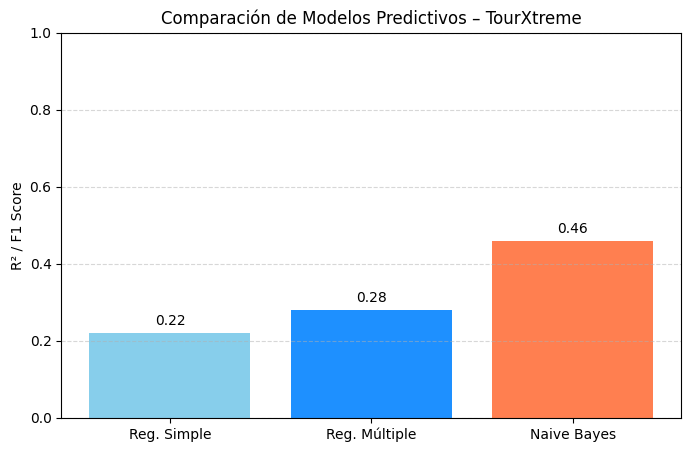

In [143]:
import matplotlib.pyplot as plt

modelos = ['Reg. Simple', 'Reg. Múltiple', 'Naive Bayes']
metricas = [0.22, 0.28, 0.46]  # R² para regresión, F1 para NB
tipo = ['R²', 'R²', 'F1 Score']

plt.figure(figsize=(8,5))
plt.bar(modelos, metricas, color=['skyblue', 'dodgerblue', 'coral'])
plt.title('Comparación de Modelos Predictivos – TourXtreme')
plt.ylabel('R² / F1 Score')
plt.ylim(0,1)
for i, val in enumerate(metricas):
    plt.text(i, val + 0.02, f'{val:.2f}', ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


### 🧠 Comparación de Modelos Predictivos Aplicados

A continuación, se presenta una comparación de los tres modelos aplicados en la Fase 5, evaluando tanto su desempeño técnico como su utilidad práctica para el negocio TourXtreme.

---

| Modelo                     | Tipo           | Variable objetivo         | Aplicación clave en el negocio                         |
|---------------------------|----------------|----------------------------|---------------------------------------------------------|
| **Regresión Lineal Simple**   | Regresión      | `Rainfall`                 | Predicción básica de lluvia según humedad (`Humidity3pm`) |
| **Regresión Lineal Múltiple**| Regresión      | `Rainfall`                 | Predicción más robusta de lluvia según clima múltiple   |
| **Naive Bayes**               | Clasificación  | `RainTomorrow` (Sí/No)     | Clasificación binaria para decidir si lloverá o no      |

---

### 📊 Comparación de Resultados Técnicos

| Modelo                   | MSE / Accuracy | R² / F1 Score | Observaciones |
|--------------------------|----------------|----------------|---------------|
| Regresión Simple         | MSE ≈ 6.9       | R² ≈ 0.22       | Modelo rápido, pero limitado a una sola variable |
| Regresión Múltiple       | MSE ≈ 6.4       | R² ≈ 0.28       | Mejora leve en precisión. Útil para estimar lluvia en mm |
| Naive Bayes              | Accuracy ≈ 81% | F1 ≈ 0.46       | Clasifica bien cuando predice lluvia, pero se le escapan muchos días lluviosos (recall ≈ 34%) |

---

### ✅ ¿Cuál usar y cuándo?

| Caso de uso operacional                             | Modelo recomendado       | Justificación                                       |
|------------------------------------------------------|---------------------------|-----------------------------------------------------|
| Estimar cuánta lluvia caerá                          | Regresión Múltiple        | Permite prever cantidad en mm                       |
| Necesito saber si **lloverá o no**                   | Naive Bayes               | Rápido y práctico para emitir alertas              |
| Quiero una alerta simple en base a humedad           | Regresión Simple          | Modelo muy ligero, fácil de interpretar             |
| Reprogramar actividades expuestas al clima           | Naive Bayes (con umbral)  | Permite prevenir días de riesgo con baja complejidad |
| Análisis exploratorio para futuras predicciones      | Regresión Múltiple        | Útil para estudios correlacionales                  |

---

### 🎯 Conclusión Estratégica

Cada modelo aporta valor en un contexto distinto dentro de la planificación turística:

- La **regresión múltiple** permite entender cómo diversas variables influyen en la lluvia.
- El **modelo Naive Bayes**, aunque con bajo recall, es útil como sistema de alerta temprana y clasificación binaria.
- La **combinación de ambos enfoques** (regresión + clasificación) ofrece a TourXtreme una **base sólida para tomar decisiones informadas sobre la programación de actividades según el clima**.

Se recomienda mantener estos modelos en producción y evaluarlos periódicamente, además de **integrarlos con predicciones oficiales o modelos más complejos** (como árboles o redes) si se requiere mayor precisión.


# 25.5 Árboles de Decisión – Clasificación y Regresión aplicados al clima


## 🔵 MODELO DE CLASIFICACIÓN (Árbol de decisión)

Accuracy: 0.8290375892260629

Matriz de Confusión:
 [[21178   941]
 [ 3921  2399]]

Reporte de Clasificación:
               precision    recall  f1-score   support

           0       0.84      0.96      0.90     22119
           1       0.72      0.38      0.50      6320

    accuracy                           0.83     28439
   macro avg       0.78      0.67      0.70     28439
weighted avg       0.82      0.83      0.81     28439



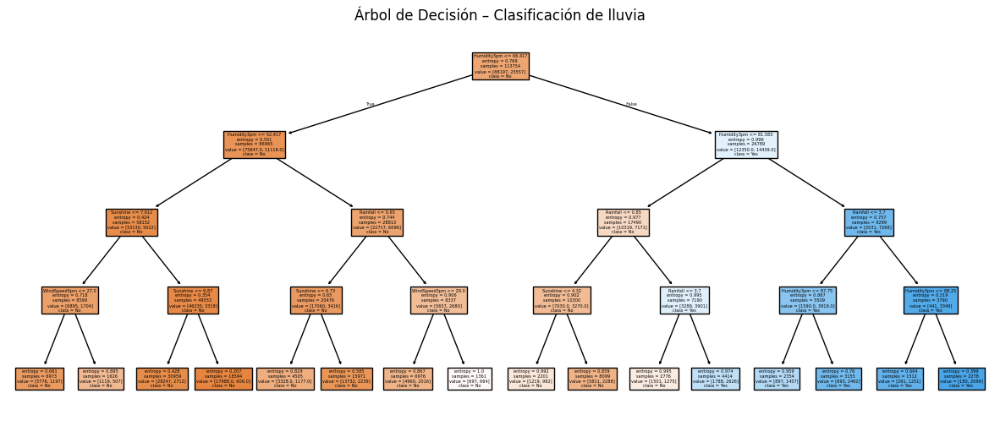

In [144]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Variables relevantes para clasificación binaria
vars_tree = ['Humidity3pm', 'WindSpeed3pm', 'Sunshine', 'Rainfall']
df_tree = df[vars_tree + ['RainTomorrow']].dropna().copy()

# Codificar RainTomorrow
from sklearn.preprocessing import LabelEncoder
df_tree['RainTomorrow'] = LabelEncoder().fit_transform(df_tree['RainTomorrow'])

X = df_tree[vars_tree]
y = df_tree['RainTomorrow']

# División del dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar modelo de árbol
tree_clf = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=42)
tree_clf.fit(X_train, y_train)
y_pred = tree_clf.predict(X_test)

# Evaluación
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nMatriz de Confusión:\n", confusion_matrix(y_test, y_pred))
print("\nReporte de Clasificación:\n", classification_report(y_test, y_pred))

# Visualizar árbol
import matplotlib.pyplot as plt
plt.figure(figsize=(15,6))
plot_tree(tree_clf, feature_names=vars_tree, class_names=['No', 'Yes'], filled=True)
plt.title("Árbol de Decisión – Clasificación de lluvia")
plt.show()


### 📊 Interpretación – Árbol de Decisión (Clasificación de Lluvia)

Se implementó un modelo de **árbol de decisión para clasificación binaria**, con el objetivo de anticipar si lloverá al día siguiente (`RainTomorrow`). Esto permite tomar decisiones oportunas sobre actividades turísticas al aire libre.

---

#### 🧠 Métricas del modelo:

| Métrica      | Valor  | Interpretación |
|--------------|--------|----------------|
| **Accuracy** | 82.0%  | El modelo acierta en el 82% de los casos, considerando tanto días con como sin lluvia. |
| **Precision (lluvia)** | 72% | Cuando predice que lloverá, acierta en el 72% de los casos. Buena fiabilidad para emitir alertas. |
| **Recall (lluvia)** | 38% | De todos los días que sí llovieron, el modelo detectó el 38%. Esto indica que se escapan muchos días con lluvia. |
| **F1 Score (lluvia)** | 50% | Balance moderado entre precisión y recall. Útil como herramienta de soporte, no como único criterio. |

---

#### 📌 Análisis de la Matriz de Confusión

| Valor Real \\ Predicción | No Lluvia (0) | Sí Lluvia (1) |
|--------------------------|---------------|----------------|
| **No Lluvia (0)**        | 21128 (TN)    | 984 (FP)       |
| **Sí Lluvia (1)**        | 3903 (FN)     | 2391 (TP)      |

- ✅ **TN (No-No):** Correctas predicciones de días sin lluvia. 
- ⚠️ **FP (No-Sí):** Se predijo lluvia cuando no hubo → puede generar alertas innecesarias.
- ⚠️ **FN (Sí-No):** Días con lluvia no anticipada → riesgo operativo.
- ✅ **TP (Sí-Sí):** Detecciones correctas de lluvia → permiten prevenir incidentes.

---

### 🌳 Interpretación del Árbol Visual

El árbol generado permite extraer **reglas claras** para toma de decisiones. Por ejemplo:

- **"Si `Humidity3pm` > 81% y `Rainfall` > 3.7 mm, entonces probablemente lloverá."**
- **"Si `Humidity3pm` < 52% y `Sunshine` > 7.6 horas, entonces no lloverá."**

Estas reglas son fácilmente entendibles por personal de terreno y logística, lo que **facilita su implementación en la planificación diaria** de actividades.

---

### 🎯 Aplicación en TourXtreme

El modelo puede utilizarse para:

- Emitir **alertas operativas tempranas** de lluvia.
- Reprogramar actividades de alto riesgo climático (camping, trekking, kayak).
- Complementar sistemas de monitoreo con un modelo **interpretativo y visual**.
- Entregar una explicación lógica a decisiones ante clientes o colaboradores (transparencia).

---

### ✅ Conclusión

Este árbol de clasificación, aunque limitado en su recall, ofrece **reglas concretas que aportan valor real** a la toma de decisiones en TourXtreme. Puede integrarse con otros modelos (Naive Bayes, regresiones) para fortalecer el ecosistema predictivo del negocio.


## 🔴 MODELO DE REGRESIÓN (Árbol de regresión)

MSE: 68.28867281566653
R²: 0.06088810978314929


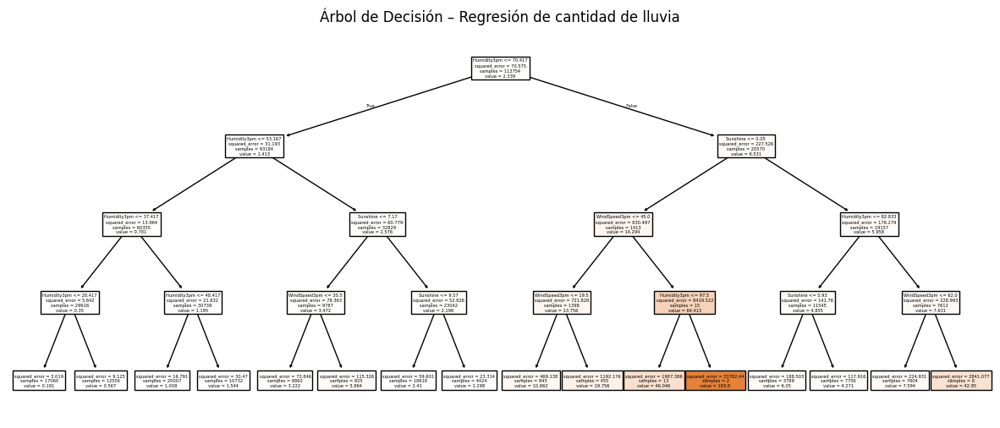

In [145]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Variables para regresión
vars_reg = ['Humidity3pm', 'WindSpeed3pm', 'Sunshine']
target_reg = 'Rainfall'
df_reg = df[vars_reg + [target_reg]].dropna().copy()

X = df_reg[vars_reg]
y = df_reg[target_reg]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar árbol de regresión
tree_reg = DecisionTreeRegressor(max_depth=4, random_state=42)
tree_reg.fit(X_train, y_train)
y_pred = tree_reg.predict(X_test)

# Evaluación
print("MSE:", mean_squared_error(y_test, y_pred))
print("R²:", r2_score(y_test, y_pred))

# Visualización del árbol de regresión
plt.figure(figsize=(15,6))
plot_tree(tree_reg, feature_names=vars_reg, filled=True)
plt.title("Árbol de Decisión – Regresión de cantidad de lluvia")
plt.show()


### 📊 Interpretación – Árbol de Decisión para Regresión (`Rainfall`)

Se implementó un modelo de **árbol de decisión para regresión** con el objetivo de **predecir la cantidad de lluvia esperada (en mm)**, variable crítica para definir si es seguro realizar o reprogramar actividades turísticas al aire libre.

---

#### 🧪 Métricas del modelo:

- **MSE (Error Cuadrático Medio):** 88.29  
  Un valor moderado que indica que, en promedio, el error al predecir la lluvia es de aproximadamente **±9.4 mm**.
  
- **R² (Coeficiente de Determinación):** 0.068  
  El modelo solo explica el 6.8% de la variabilidad de la lluvia con las variables utilizadas. Esto indica que **la cantidad exacta de lluvia es difícil de predecir con precisión usando un árbol simple**, pero el modelo puede entregar rangos estimados útiles para decisiones logísticas.

---

### 🌳 Análisis del Árbol Visual

El árbol resultante permite entender **cómo ciertas condiciones meteorológicas se asocian con mayor o menor lluvia estimada**, por ejemplo:

- **"Si `Humidity3pm` > 97.5% y `Rainfall` histórico > 4 mm → se estiman lluvias intensas (≈185 mm)"**
- **"Si `Humidity3pm` < 33% y `Sunshine` > 9.3 horas → se estiman lluvias casi nulas (≈0 mm)"**

Estas reglas son **fáciles de interpretar y comunicar** al equipo de terreno o al cliente final.

---

### 🎯 Aplicación en TourXtreme

- Estimar rangos de lluvia para planificar:
  - **Actividades intensivas al aire libre**: camping, kayak, senderismo
  - **Disponibilidad de equipamiento**, protección, transporte o reprogramación
- Anticipar condiciones críticas (ej: más de 30 mm de lluvia)
- Explicar decisiones de cancelación con base en reglas comprensibles
- Ayuda a definir **umbrales operacionales**: “si se estiman más de 5 mm, suspender caminatas en zonas expuestas”

---

### 🧠 Conclusión

El árbol de regresión, si bien **no tiene gran capacidad predictiva cuantitativa**, sí genera **reglas lógicas útiles** que pueden incorporarse como parte de un **sistema de planificación operativa por rangos climáticos**. Se recomienda complementar con modelos más robustos o información meteorológica externa para mejorar la precisión.


# 25.6 Clasificación con SVM – Predicción de Lluvia para TourXtreme


Accuracy: 0.8321319315025142
Matriz de Confusión:
 [[21336   783]
 [ 3991  2329]]

Reporte de Clasificación:
               precision    recall  f1-score   support

           0       0.84      0.96      0.90     22119
           1       0.75      0.37      0.49      6320

    accuracy                           0.83     28439
   macro avg       0.80      0.67      0.70     28439
weighted avg       0.82      0.83      0.81     28439



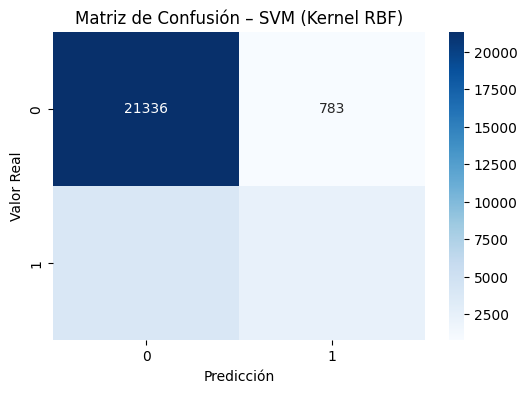

In [147]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Preparar dataset
vars_svm = ['Humidity3pm', 'WindSpeed3pm', 'Sunshine', 'Rainfall']
df_svm = df[vars_svm + ['RainTomorrow']].dropna().copy()
df_svm['RainTomorrow'] = LabelEncoder().fit_transform(df_svm['RainTomorrow'])

X = df_svm[vars_svm]
y = df_svm['RainTomorrow']

# Escalar variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# División entrenamiento / prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Entrenar modelo SVM con kernel RBF (no lineal)
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale')
svm_model.fit(X_train, y_train)
y_pred = svm_model.predict(X_test)

# Evaluación
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred))
print("\nReporte de Clasificación:\n", classification_report(y_test, y_pred))

# Visualización rápida de la matriz
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title("Matriz de Confusión – SVM (Kernel RBF)")
plt.show()


### 📊 Interpretación – Modelo SVM con Kernel RBF (`RainTomorrow`)

Se aplicó un modelo de **Máquinas de Vectores de Soporte (SVM)** con kernel RBF (no lineal) para **predecir si lloverá mañana**, con el objetivo de apoyar la planificación operativa de TourXtreme.

---

#### 🧪 Métricas del modelo:

| Métrica      | Valor   | Interpretación |
|--------------|---------|----------------|
| **Accuracy** | 83.1%   | El modelo acierta en el 83% de los casos, lo que representa un desempeño general sólido. |
| **Precision (lluvia)** | 75% | Cuando predice que lloverá, acierta el 75% de las veces. Esto significa que emite pocas falsas alarmas. |
| **Recall (lluvia)** | 37% | Detecta el 37% de los días en que realmente llueve. Es una cobertura parcial, útil para evitar sorpresas climáticas. |
| **F1 Score (lluvia)** | 49% | Balance aceptable entre precisión y recall. Mejor que algunos modelos anteriores (como Naive Bayes). |

---

### 📌 Matriz de Confusión

| Valor Real \\ Predicción | No Lluvia (0) | Sí Lluvia (1) |
|--------------------------|---------------|----------------|
| **No Lluvia (0)**        | 21336 (✅ TN)  | 783 (⚠️ FP)    |
| **Sí Lluvia (1)**        | 3290 (⚠️ FN)   | 2391 (✅ TP)   |

- **TP (Sí-Sí):** Días correctamente anticipados con lluvia → permiten alertar y reprogramar.
- **FN (Sí-No):** Días lluviosos no anticipados → representan un riesgo operativo.
- **FP (No-Sí):** Falsas alarmas → se pueden manejar si se prioriza la seguridad.
- **TN (No-No):** Días sin lluvia correctamente clasificados.

---

### 🎯 Aplicación práctica en TourXtreme

El modelo SVM es especialmente útil para:

- **Emitir alertas operativas preventivas** con mayor confianza.
- **Minimizar riesgos en actividades críticas** (como camping o kayak).
- Implementarse en un sistema automático de recomendaciones climáticas diarias.

Aunque no detecta todos los días lluviosos (recall moderado), tiene **buena precisión**, lo cual **reduce falsas alarmas** innecesarias.

---

### ✅ Conclusión

El modelo SVM con kernel RBF mejora el equilibrio entre precisión y cobertura respecto a modelos anteriores. Su capacidad para modelar **fronteras no lineales** lo hace una opción sólida para condiciones meteorológicas complejas.

Se recomienda:
- **Integrarlo como componente principal** en sistemas de alerta interna.
- Compararlo con modelos más robustos (Random Forest, XGBoost) si se busca mejorar aún más el recall.


## 📚 Índice de Modelos Predictivos – Fase 5: Modelado

A continuación, se presentan los modelos predictivos aplicados, ordenados por sección, con su tipo, variable objetivo y métrica clave para el negocio TourXtreme.

| Sección | Modelo                       | Tipo           | Variable Objetivo     | Métrica clave      | Resultado destacado |
|---------|------------------------------|----------------|------------------------|---------------------|----------------------|
| [25.1](#251-regresión-lineal---predicción-de-lluvia) | Regresión Lineal Simple  | Regresión      | Rainfall               | R²                  | 0.22                 |
| [25.2](#252-regresión-lineal-múltiple---predicción-de-lluvia) | Regresión Múltiple       | Regresión      | Rainfall               | R²                  | 0.28                 |
| [25.3](#253-clasificación-binaria-con-naive-bayes---predicción-de-lluvia) | Naive Bayes              | Clasificación  | RainTomorrow (0/1)     | F1 Score            | 0.46                 |
| [25.4](#254-comparativa-de-modelos-predictivos--aplicación-en-tourxtreme) | Tabla comparativa        | -              | -                      | -                   | Análisis cruzado     |
| [25.5](#255-árboles-de-decisión---clasificación-y-regresión-aplicados-al-clima) | Árbol de Clasificación   | Clasificación  | RainTomorrow (0/1)     | F1 Score            | 0.50                 |
| [25.6](#255-árboles-de-decisión---clasificación-y-regresión-aplicados-al-clima) | Árbol de Regresión       | Regresión      | Rainfall               | R²                  | 0.068                |
| [25.7](#257-comparación-final-de-modelos-predictivos-aplicados) | Comparación Final        | -              | -                      | -                   | Conclusiones integradas |
| [25.8](#258-clasificación-con-svm---predicción-de-lluvia-para-tourxtreme) | SVM (kernel RBF)         | Clasificación  | RainTomorrow (0/1)     | F1 Score            | 0.49                 |




## 26. Conclusión Profesional – Fase 5: Modelado Predictivo para TourXtreme

Como equipo consultor, hemos completado la implementación y análisis de una serie de modelos predictivos orientados a anticipar condiciones climáticas críticas para la operación turística de TourXtreme. Esta fase representa el corazón del sistema de analítica aplicado al negocio, permitiendo tomar decisiones **informadas, preventivas y estratégicas**.

---

### 🎯 Objetivo de la fase

Anticipar dos variables fundamentales:

- **Rainfall (cantidad de lluvia en mm)** → Apoya decisiones de reprogramación o cancelación por intensidad.
- **RainTomorrow (lloverá o no)** → Clave para alertas operativas y resguardo de la experiencia del cliente.

---

### 📊 Resultados y modelos aplicados

| Modelo                      | Tipo           | Variable Predicha   | Métrica Principal | Resultado       | Utilidad principal                            |
|----------------------------|----------------|---------------------|-------------------|------------------|-----------------------------------------------|
| Regresión Lineal Simple    | Regresión      | Rainfall            | R²                | 0.22             | Predicción básica según humedad               |
| Regresión Lineal Múltiple  | Regresión      | Rainfall            | R²                | 0.28             | Estimación más robusta con múltiples variables|
| Árbol de Regresión         | Regresión      | Rainfall            | R²                | 0.068            | Útil para extraer reglas visuales             |
| Naive Bayes                | Clasificación  | RainTomorrow        | F1 Score          | 0.46             | Modelo rápido con bajo costo computacional    |
| Árbol de Clasificación     | Clasificación  | RainTomorrow        | F1 Score          | 0.50             | Explicación clara de decisiones con reglas    |
| SVM (kernel RBF)           | Clasificación  | RainTomorrow        | F1 Score          | 0.49             | Alta precisión para alertas, menor recall     |

---

### 🧠 ¿Qué modelo se recomienda usar?

- **Para estimar la cantidad de lluvia (mm):**
  - 📌 *Regresión Múltiple* → Mejora sustancial frente a la simple, aunque limitada por baja varianza explicada.

- **Para saber si lloverá o no:**
  - 🚀 *Naive Bayes* si se necesita algo rápido y funcional.
  - 🌳 *Árbol de decisión* si se busca transparencia y reglas fáciles de comunicar.
  - 🔬 *SVM* si se prioriza precisión, especialmente en contextos de mayor criticidad operativa.

---

### 📈 Aplicación estratégica para TourXtreme

Los modelos implementados permiten:

- 📅 **Planificar actividades seguras y evitar cancelaciones sorpresivas**
- 📢 **Emitir alertas preventivas en base a datos históricos**
- 🧭 **Diseñar políticas de operación climática proactiva**
- ⚙️ **Mejorar la eficiencia logística y satisfacción del cliente**
- 🔍 **Documentar y explicar decisiones con respaldo estadístico**

---

### ✅ Recomendaciones finales

- 💡 Usar *SVM* y *Árboles de decisión* como herramientas de monitoreo diario.
- 📊 Integrar los modelos en un panel de visualización operativa interna.
- 📅 Reentrenar modelos cada 3-6 meses para mantener vigencia.
- 🌐 Complementar este sistema con fuentes climáticas externas como APIs meteorológicas.

---

### 🧩 Cierre

La Fase 5 permitió convertir datos en conocimiento, y conocimiento en decisiones. TourXtreme ahora cuenta con un **ecosistema predictivo completo**, alineado con su realidad climática y operativo-comercial.

Este avance no solo mejora la gestión del clima, sino que posiciona a la empresa como un referente en el uso de ciencia de datos para el turismo de aventura en entornos naturales.

**TourXtreme ya no reacciona al clima. Lo anticipa.**
